In [1]:
%matplotlib inline

import numpy as np
import copy
import matplotlib.pyplot as plt
import pickle
import random
import torch
from utils import torch_from_numpy
import datetime

from config import cfg_seed, cfg_env, cfg_z_dim, cfg_alpha
seed = cfg_seed


# bif_c = 0.1
num_iter_max=200000
# alpha=0.2
alpha=cfg_alpha
vae_lr=5e-4
ratio_lr=5e-4
ratio_early=100
env_name = 'CustomPendulum-v0'
env_str=cfg_env
figfilenamehead = "fig_policy_optimization_"+env_str+"_iter1_"

loss_list = []
normalized_loss_list = []

print("alpha",alpha)
print(datetime.datetime.now())

alpha 0.1
2023-05-10 19:54:40.743504


In [2]:
import gym
import custom_gym
env = gym.make(env_name)

np.random.seed(seed)
random.seed(seed)
env.seed(seed)
env.action_space.seed(seed)
torch.manual_seed(seed)

s_dim = env.reset().flatten().shape[0]
a_dim = env.action_space.sample().flatten().shape[0]
z_dim = cfg_z_dim
print(s_dim, a_dim, z_dim)



2 1 1


/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/core.py:329: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:174: UserWarning: WARN: Future gym versions will require that `Env.reset` can be passed a `seed` instead of using `Env.seed` for resetting the environment random number generator.
  logger.warn(
/home/proxima-hishinuma/anaconda3/

In [3]:


from sac import SAC
# agent = SAC(env.observation_space.shape[0], env.action_space)
agent = SAC(env.observation_space.shape[0]+z_dim*2, env.action_space)
agent.load_checkpoint(ckpt_path="checkpoints/sac_checkpoint_custom_"+env_str+"_bamdp_standardvae_")


offline_data = pickle.load(open("offline_data_"+env_str+".pkl","rb"))
debug_info = pickle.load(open("offline_data_debug_info_"+env_str+".pkl","rb"))
debug_info = np.array(debug_info)

Loading models from checkpoints/sac_checkpoint_custom_pendulum_bamdp_standardvae_


In [4]:
args_init_dict = {
    "offline_data": offline_data,
    "s_dim": s_dim,
    "a_dim": a_dim,
    "z_dim": z_dim,
    #              "policy":agent.select_action,
    "mdp_policy":None,
    "bamdp_policy":agent.policy.my_np_select_action,
    "debug_info":debug_info,
    "env" : env,
    "ckpt_suffix" : env_str
}
# import vi_base
# vi = vi_base.baseVI(args_init_dict)
import vi_iw
iwvi = vi_iw.iwVI(args_init_dict)

iwvi.load_base(ckpt_key="unweighted")
# iwvi.update_mulogvar_offlinedata()

base load ckpt ckpt_basevi_pendulum_unweighted
base load self.initial_belief.data.sum() tensor(-4.8636)
base load dec.state_dict()['net_phat.0.weight'].sum() tensor(4.7644)


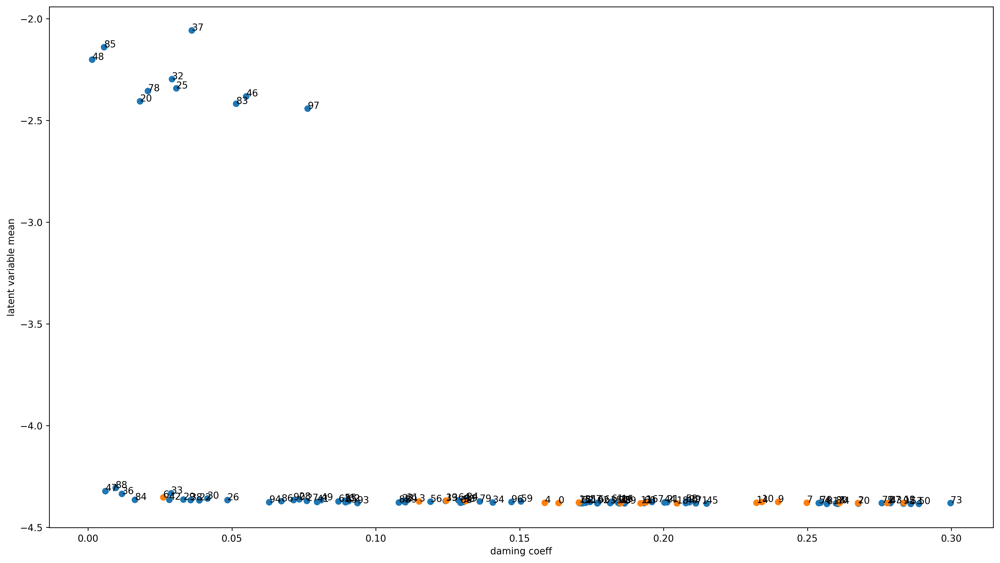

[0.16346495 0.19376823 0.2675319  0.11503246 0.15866848 0.27767899
 0.02613879 0.24978595 0.26100364 0.23974757]
[0.23415875 0.19197631 0.28340068 0.12439858 0.23227011 0.17053018
 0.18529065 0.1850802  0.20454609 0.13110959]
[0.01806764 0.20119136 0.03867789 0.10911323 0.13158045 0.03061344
 0.04839286 0.07598748 0.07332768 0.03311254]
[0.04145489 0.11061755 0.02913038 0.02882952 0.14059536 0.18145366
 0.01175634 0.03605897 0.03561832 0.1242789 ]
[0.20774164 0.07961685 0.02818215 0.27878886 0.20022311 0.21489816
 0.05495741 0.00603226 0.00140864 0.08100239]
[0.28865656 0.1728472  0.17167557 0.2858247  0.2539226  0.08923109
 0.11895172 0.17438186 0.20775948 0.15039731]
[0.19319706 0.18191796 0.09047245 0.08702328 0.12863061 0.0894847
 0.17726183 0.19596025 0.12942553 0.11026856]
[0.26757701 0.21116658 0.27584478 0.2996541  0.26043782 0.18466787
 0.25440247 0.17073022 0.0207501  0.1360628 ]
[0.2599147  0.256741   0.10799342 0.0514889  0.0163014  0.00555654
 0.06717741 0.27842439 0.00955

In [5]:
plt.figure(figsize=(18,10), dpi=250)
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()
plt.xlabel("daming coeff")
plt.ylabel("latent variable mean")

plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.xlim([-0.05,0.35])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_"+env_str+"_iter0.png")
plt.savefig(figfilenamehead+"damping_latent_"+env_str+"_iter0.eps")
# plt.savefig(figfilenamehead+"damping_latent_"+env_str+"_iter0.pdf")
plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [6]:
iwvi.get_real_rollout_bamdppolicy_data()


 0 7.152557373046875e-07


/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:227: DeprecationWarning: WARN: Core environment is written in old step API which returns one bool instead of two. It is recommended to rewrite the environment with new step API. 
  logger.deprecation(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(done, (bool, np.bool8)):
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:141: UserWarning: WARN: The obs returned by the `step()` method was expecting numpy array dtype to be float32, actual type: float64
  logger.warn(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:165: UserWarning: WARN: The obs returned by the `step()` method is not within the observ


 1 6.221513271331787

 2 6.695469379425049

 3 4.152649164199829

 4 3.0244903564453125

 5 3.2581722736358643

 6 3.371304988861084

 7 3.344876527786255

 8 2.976013660430908

 9 3.250229597091675

 10 3.052884817123413

 11 3.0183489322662354

 12 3.305530309677124

 13 3.202104330062866

 14 3.021840810775757

 15 3.086754083633423

 16 3.1460206508636475

 17 3.0617852210998535

 18 3.86606764793396

 19 6.482326507568359

 20 6.845624685287476

 21 7.138530492782593

 22 6.55469274520874

 23 7.195375442504883

 24 6.664514541625977

 25 6.330481290817261

 26 6.019410848617554

 27 3.183854579925537

 28 3.568462610244751

 29 3.244096517562866

 30 3.2032554149627686

 31 3.2768306732177734

 32 3.2048540115356445

 33 3.1635711193084717

 34 3.2923524379730225

 35 3.1044676303863525

 36 3.3904099464416504

 37 3.3221473693847656

 38 3.2863779067993164

 39 3.262573719024658

 40 3.2053723335266113

 41 3.0300025939941406

 42 3.2144320011138916

 43 3.2284841537475586

 44

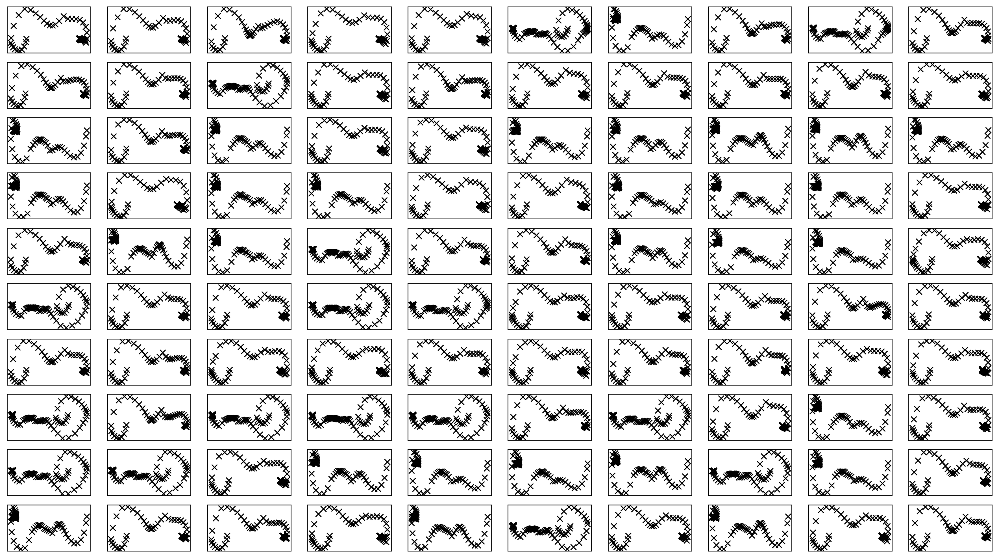

In [7]:
fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.show()

In [8]:
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)


 0 2.384185791015625e-07

 1 3.2555952072143555

 2 3.0842509269714355

 3 3.329465627670288

 4 3.114036798477173

 5 3.089902400970459

 6 3.312883138656616

 7 2.948410987854004

 8 3.1888587474823

 9 3.0921390056610107

 10 3.032717227935791

 11 3.12785267829895

 12 3.195862293243408

 13 3.088527202606201

 14 3.1498947143554688

 15 3.2781524658203125

 16 3.1825668811798096

 17 3.0617055892944336

 18 3.060939073562622

 19 3.3520426750183105

 20 3.0411131381988525

 21 3.1069283485412598

 22 3.118049144744873

 23 3.4154348373413086

 24 3.0359206199645996

 25 3.324669361114502

 26 3.1258175373077393

 27 3.364896774291992

 28 3.0201025009155273

 29 3.0223498344421387

 30 3.070528507232666

 31 3.2597596645355225

 32 3.208141326904297

 33 3.504640579223633

 34 3.335665225982666

 35 3.1966352462768555

 36 3.1026625633239746

 37 3.2116570472717285

 38 3.344013214111328

 39 3.07342791557312

 40 5.449836492538452

 41 4.6991918087005615

 42 3.4187588691711426


実環境方策rollout vs Sim環境方策rollout


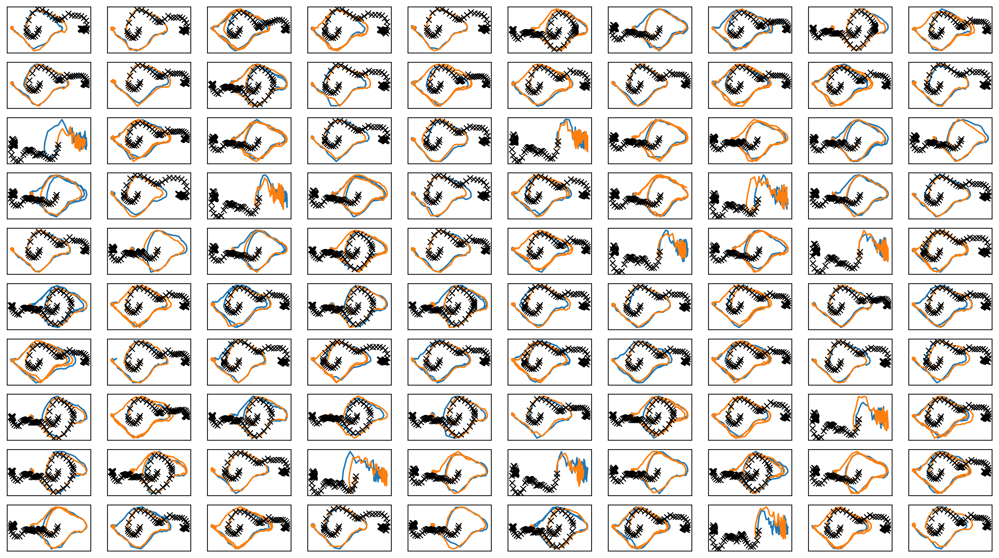

In [10]:


fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
#     ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"iter0.png")
# plt.savefig(figfilenamehead+"iter0.pdf")
plt.savefig(figfilenamehead+"iter0.eps")
print("実環境方策rollout vs Sim環境方策rollout")

In [11]:
print(datetime.datetime.now())

2023-05-10 20:14:01.246596


# Iter 1

In [12]:
iwvi.get_sim_rollout_bamdppolicy_data_randomstop()


 0

 1

 2

 3

 4

 5

 6

 7

 8

 9

 10

 11

 12

 13

 14

 15

 16

 17

 18

 19

 20

 21

 22

 23

 24

 25

 26

 27

 28

 29

 30

 31

 32

 33

 34

 35

 36

 37

 38

 39

 40

 41

 42

 43

 44

 45

 46

 47

 48

 49

 50

 51

 52

 53

 54

 55

 56

 57

 58

 59

 60

 61

 62

 63

 64

 65

 66

 67

 68

 69

 70

 71

 72

 73

 74

 75

 76

 77

 78

 79

 80

 81

 82

 83

 84

 85

 86

 87

 88

 89

 90

 91

 92

 93

 94

 95

 96

 97

 98

 99
 


In [13]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)


train: iter 0  trainloss 1.34855  validloss 1.42986±0.00000  bestvalidloss 1.42986  last_update 0
train: iter 1  trainloss 1.10359  validloss 1.26805±0.00000  bestvalidloss 1.26805  last_update 0
train: iter 2  trainloss 0.72009  validloss 0.80318±0.00000  bestvalidloss 0.80318  last_update 0
train: iter 3  trainloss 0.59039  validloss 0.50326±0.00000  bestvalidloss 0.50326  last_update 0
train: iter 4  trainloss 0.55204  validloss 0.43173±0.00000  bestvalidloss 0.43173  last_update 0
train: iter 5  trainloss 0.52761  validloss 0.40183±0.00000  bestvalidloss 0.40183  last_update 0
train: iter 6  trainloss 0.51162  validloss 0.37691±0.00000  bestvalidloss 0.37691  last_update 0
train: iter 7  trainloss 0.49700  validloss 0.36232±0.00000  bestvalidloss 0.36232  last_update 0
train: iter 8  trainloss 0.48740  validloss 0.34303±0.00000  bestvalidloss 0.34303  last_update 0
train: iter 9  trainloss 0.48098  validloss 0.37443±0.00000  bestvalidloss 0.34303  last_update 1
train: iter 10  trai

train: iter 83  trainloss 0.27425  validloss 0.20711±0.00000  bestvalidloss 0.20369  last_update 1
train: iter 84  trainloss 0.28120  validloss 0.21317±0.00000  bestvalidloss 0.20369  last_update 2
train: iter 85  trainloss 0.27988  validloss 0.21785±0.00000  bestvalidloss 0.20369  last_update 3
train: iter 86  trainloss 0.27270  validloss 0.20420±0.00000  bestvalidloss 0.20369  last_update 4
train: iter 87  trainloss 0.27349  validloss 0.20632±0.00000  bestvalidloss 0.20369  last_update 5
train: iter 88  trainloss 0.27582  validloss 0.20494±0.00000  bestvalidloss 0.20369  last_update 6
train: iter 89  trainloss 0.27027  validloss 0.20492±0.00000  bestvalidloss 0.20369  last_update 7
train: iter 90  trainloss 0.27885  validloss 0.19831±0.00000  bestvalidloss 0.19831  last_update 0
train: iter 91  trainloss 0.27416  validloss 0.20644±0.00000  bestvalidloss 0.19831  last_update 1
train: iter 92  trainloss 0.27430  validloss 0.19729±0.00000  bestvalidloss 0.19729  last_update 0
train: ite

train: iter 167  trainloss 0.24213  validloss 0.18223±0.00000  bestvalidloss 0.17888  last_update 11
train: iter 168  trainloss 0.24233  validloss 0.17887±0.00000  bestvalidloss 0.17887  last_update 0
train: iter 169  trainloss 0.24328  validloss 0.17869±0.00000  bestvalidloss 0.17869  last_update 0
train: iter 170  trainloss 0.24489  validloss 0.17974±0.00000  bestvalidloss 0.17869  last_update 1
train: iter 171  trainloss 0.24544  validloss 0.17711±0.00000  bestvalidloss 0.17711  last_update 0
train: iter 172  trainloss 0.24795  validloss 0.17661±0.00000  bestvalidloss 0.17661  last_update 0
train: iter 173  trainloss 0.23835  validloss 0.17803±0.00000  bestvalidloss 0.17661  last_update 1
train: iter 174  trainloss 0.24560  validloss 0.18487±0.00000  bestvalidloss 0.17661  last_update 2
train: iter 175  trainloss 0.24010  validloss 0.18564±0.00000  bestvalidloss 0.17661  last_update 3
train: iter 176  trainloss 0.24138  validloss 0.18799±0.00000  bestvalidloss 0.17661  last_update 4

train: iter 249  trainloss 0.22860  validloss 0.16984±0.00000  bestvalidloss 0.16984  last_update 0
train: iter 250  trainloss 0.22980  validloss 0.17047±0.00000  bestvalidloss 0.16984  last_update 1
train: iter 251  trainloss 0.22611  validloss 0.18100±0.00000  bestvalidloss 0.16984  last_update 2
train: iter 252  trainloss 0.22403  validloss 0.17002±0.00000  bestvalidloss 0.16984  last_update 3
train: iter 253  trainloss 0.22658  validloss 0.18127±0.00000  bestvalidloss 0.16984  last_update 4
train: iter 254  trainloss 0.23615  validloss 0.19975±0.00000  bestvalidloss 0.16984  last_update 5
train: iter 255  trainloss 0.23126  validloss 0.17063±0.00000  bestvalidloss 0.16984  last_update 6
train: iter 256  trainloss 0.22611  validloss 0.17087±0.00000  bestvalidloss 0.16984  last_update 7
train: iter 257  trainloss 0.22688  validloss 0.17220±0.00000  bestvalidloss 0.16984  last_update 8
train: iter 258  trainloss 0.22769  validloss 0.23124±0.00000  bestvalidloss 0.16984  last_update 9


train: iter 331  trainloss 0.21560  validloss 0.16366±0.00000  bestvalidloss 0.16366  last_update 0
train: iter 332  trainloss 0.21903  validloss 0.16346±0.00000  bestvalidloss 0.16346  last_update 0
train: iter 333  trainloss 0.21633  validloss 0.16471±0.00000  bestvalidloss 0.16346  last_update 1
train: iter 334  trainloss 0.21553  validloss 0.16509±0.00000  bestvalidloss 0.16346  last_update 2
train: iter 335  trainloss 0.22001  validloss 0.16880±0.00000  bestvalidloss 0.16346  last_update 3
train: iter 336  trainloss 0.21840  validloss 0.18040±0.00000  bestvalidloss 0.16346  last_update 4
train: iter 337  trainloss 0.21657  validloss 0.16422±0.00000  bestvalidloss 0.16346  last_update 5
train: iter 338  trainloss 0.21630  validloss 0.17137±0.00000  bestvalidloss 0.16346  last_update 6
train: iter 339  trainloss 0.21497  validloss 0.17366±0.00000  bestvalidloss 0.16346  last_update 7
train: iter 340  trainloss 0.21577  validloss 0.16887±0.00000  bestvalidloss 0.16346  last_update 8


train: iter 414  trainloss 0.20862  validloss 0.16519±0.00000  bestvalidloss 0.15923  last_update 7
train: iter 415  trainloss 0.20841  validloss 0.16021±0.00000  bestvalidloss 0.15923  last_update 8
train: iter 416  trainloss 0.20956  validloss 0.17827±0.00000  bestvalidloss 0.15923  last_update 9
train: iter 417  trainloss 0.20801  validloss 0.16870±0.00000  bestvalidloss 0.15923  last_update 10
train: iter 418  trainloss 0.20839  validloss 0.17420±0.00000  bestvalidloss 0.15923  last_update 11
train: iter 419  trainloss 0.20789  validloss 0.16046±0.00000  bestvalidloss 0.15923  last_update 12
train: iter 420  trainloss 0.20638  validloss 0.15959±0.00000  bestvalidloss 0.15923  last_update 13
train: iter 421  trainloss 0.20882  validloss 0.16395±0.00000  bestvalidloss 0.15923  last_update 14
train: iter 422  trainloss 0.20830  validloss 0.15860±0.00000  bestvalidloss 0.15860  last_update 0
train: iter 423  trainloss 0.20762  validloss 0.18885±0.00000  bestvalidloss 0.15860  last_upda

train: iter 497  trainloss 0.20053  validloss 0.15823±0.00000  bestvalidloss 0.15457  last_update 18
train: iter 498  trainloss 0.20275  validloss 0.16633±0.00000  bestvalidloss 0.15457  last_update 19
train: iter 499  trainloss 0.20280  validloss 0.17045±0.00000  bestvalidloss 0.15457  last_update 20
train: iter 500  trainloss 0.19895  validloss 0.15608±0.00000  bestvalidloss 0.15457  last_update 21
train: iter 501  trainloss 0.20233  validloss 0.15444±0.00000  bestvalidloss 0.15444  last_update 0
train: iter 502  trainloss 0.20630  validloss 0.15490±0.00000  bestvalidloss 0.15444  last_update 1
train: iter 503  trainloss 0.20028  validloss 0.15561±0.00000  bestvalidloss 0.15444  last_update 2
train: iter 504  trainloss 0.20238  validloss 0.16095±0.00000  bestvalidloss 0.15444  last_update 3
train: iter 505  trainloss 0.19885  validloss 0.15629±0.00000  bestvalidloss 0.15444  last_update 4
train: iter 506  trainloss 0.19938  validloss 0.15754±0.00000  bestvalidloss 0.15444  last_updat

train: iter 579  trainloss 0.19742  validloss 0.15227±0.00000  bestvalidloss 0.15108  last_update 26
train: iter 580  trainloss 0.19918  validloss 0.15237±0.00000  bestvalidloss 0.15108  last_update 27
train: iter 581  trainloss 0.19646  validloss 0.15729±0.00000  bestvalidloss 0.15108  last_update 28
train: iter 582  trainloss 0.19754  validloss 0.18181±0.00000  bestvalidloss 0.15108  last_update 29
train: iter 583  trainloss 0.19872  validloss 0.15679±0.00000  bestvalidloss 0.15108  last_update 30
train: iter 584  trainloss 0.19762  validloss 0.15485±0.00000  bestvalidloss 0.15108  last_update 31
train: iter 585  trainloss 0.19746  validloss 0.16627±0.00000  bestvalidloss 0.15108  last_update 32
train: iter 586  trainloss 0.19495  validloss 0.16902±0.00000  bestvalidloss 0.15108  last_update 33
train: iter 587  trainloss 0.19604  validloss 0.15093±0.00000  bestvalidloss 0.15093  last_update 0
train: iter 588  trainloss 0.19529  validloss 0.15536±0.00000  bestvalidloss 0.15093  last_u

train: iter 661  trainloss 0.18974  validloss 0.15133±0.00000  bestvalidloss 0.14936  last_update 5
train: iter 662  trainloss 0.19400  validloss 0.16839±0.00000  bestvalidloss 0.14936  last_update 6
train: iter 663  trainloss 0.19084  validloss 0.15062±0.00000  bestvalidloss 0.14936  last_update 7
train: iter 664  trainloss 0.19161  validloss 0.15153±0.00000  bestvalidloss 0.14936  last_update 8
train: iter 665  trainloss 0.19070  validloss 0.15015±0.00000  bestvalidloss 0.14936  last_update 9
train: iter 666  trainloss 0.19191  validloss 0.15225±0.00000  bestvalidloss 0.14936  last_update 10
train: iter 667  trainloss 0.19392  validloss 0.15593±0.00000  bestvalidloss 0.14936  last_update 11
train: iter 668  trainloss 0.19153  validloss 0.14884±0.00000  bestvalidloss 0.14884  last_update 0
train: iter 669  trainloss 0.19180  validloss 0.15395±0.00000  bestvalidloss 0.14884  last_update 1
train: iter 670  trainloss 0.19461  validloss 0.15093±0.00000  bestvalidloss 0.14884  last_update 

train: iter 744  trainloss 0.18869  validloss 0.14920±0.00000  bestvalidloss 0.14782  last_update 23
train: iter 745  trainloss 0.18758  validloss 0.14852±0.00000  bestvalidloss 0.14782  last_update 24
train: iter 746  trainloss 0.18713  validloss 0.14821±0.00000  bestvalidloss 0.14782  last_update 25
train: iter 747  trainloss 0.18928  validloss 0.14897±0.00000  bestvalidloss 0.14782  last_update 26
train: iter 748  trainloss 0.19014  validloss 0.14743±0.00000  bestvalidloss 0.14743  last_update 0
train: iter 749  trainloss 0.18866  validloss 0.14911±0.00000  bestvalidloss 0.14743  last_update 1
train: iter 750  trainloss 0.18625  validloss 0.14955±0.00000  bestvalidloss 0.14743  last_update 2
train: iter 751  trainloss 0.19073  validloss 0.14736±0.00000  bestvalidloss 0.14736  last_update 0
train: iter 752  trainloss 0.19047  validloss 0.18280±0.00000  bestvalidloss 0.14736  last_update 1
train: iter 753  trainloss 0.18614  validloss 0.14885±0.00000  bestvalidloss 0.14736  last_updat

train: iter 827  trainloss 0.18365  validloss 0.15460±0.00000  bestvalidloss 0.14610  last_update 59
train: iter 828  trainloss 0.18557  validloss 0.15499±0.00000  bestvalidloss 0.14610  last_update 60
train: iter 829  trainloss 0.18858  validloss 0.15651±0.00000  bestvalidloss 0.14610  last_update 61
train: iter 830  trainloss 0.18449  validloss 0.15725±0.00000  bestvalidloss 0.14610  last_update 62
train: iter 831  trainloss 0.18419  validloss 0.14677±0.00000  bestvalidloss 0.14610  last_update 63
train: iter 832  trainloss 0.18506  validloss 0.14698±0.00000  bestvalidloss 0.14610  last_update 64
train: iter 833  trainloss 0.18365  validloss 0.15166±0.00000  bestvalidloss 0.14610  last_update 65
train: iter 834  trainloss 0.18374  validloss 0.14878±0.00000  bestvalidloss 0.14610  last_update 66
train: iter 835  trainloss 0.18594  validloss 0.15111±0.00000  bestvalidloss 0.14610  last_update 67
train: iter 836  trainloss 0.18501  validloss 0.14879±0.00000  bestvalidloss 0.14610  last_

train: iter 909  trainloss 0.18178  validloss 0.15000±0.00000  bestvalidloss 0.14457  last_update 19
train: iter 910  trainloss 0.18146  validloss 0.15001±0.00000  bestvalidloss 0.14457  last_update 20
train: iter 911  trainloss 0.18158  validloss 0.14891±0.00000  bestvalidloss 0.14457  last_update 21
train: iter 912  trainloss 0.18167  validloss 0.14843±0.00000  bestvalidloss 0.14457  last_update 22
train: iter 913  trainloss 0.18153  validloss 0.14683±0.00000  bestvalidloss 0.14457  last_update 23
train: iter 914  trainloss 0.18201  validloss 0.14530±0.00000  bestvalidloss 0.14457  last_update 24
train: iter 915  trainloss 0.18096  validloss 0.14642±0.00000  bestvalidloss 0.14457  last_update 25
train: iter 916  trainloss 0.18305  validloss 0.14792±0.00000  bestvalidloss 0.14457  last_update 26
train: iter 917  trainloss 0.18439  validloss 0.14391±0.00000  bestvalidloss 0.14391  last_update 0
train: iter 918  trainloss 0.18209  validloss 0.15112±0.00000  bestvalidloss 0.14391  last_u

train: iter 991  trainloss 0.18093  validloss 0.14718±0.00000  bestvalidloss 0.14271  last_update 71
train: iter 992  trainloss 0.17779  validloss 0.14777±0.00000  bestvalidloss 0.14271  last_update 72
train: iter 993  trainloss 0.17922  validloss 0.14365±0.00000  bestvalidloss 0.14271  last_update 73
train: iter 994  trainloss 0.17895  validloss 0.14566±0.00000  bestvalidloss 0.14271  last_update 74
train: iter 995  trainloss 0.17915  validloss 0.14542±0.00000  bestvalidloss 0.14271  last_update 75
train: iter 996  trainloss 0.17994  validloss 0.14405±0.00000  bestvalidloss 0.14271  last_update 76
train: iter 997  trainloss 0.18007  validloss 0.14416±0.00000  bestvalidloss 0.14271  last_update 77
train: iter 998  trainloss 0.17868  validloss 0.14654±0.00000  bestvalidloss 0.14271  last_update 78
train: iter 999  trainloss 0.17919  validloss 0.14653±0.00000  bestvalidloss 0.14271  last_update 79
train: iter 1000  trainloss 0.17947  validloss 0.14292±0.00000  bestvalidloss 0.14271  last

([1.3485493943095208,
  1.1035902976989747,
  0.7200883477926254,
  0.5903944108635187,
  0.5520402632653714,
  0.5276136960834265,
  0.5116163022816181,
  0.4970007598400116,
  0.48739689588546753,
  0.48097883313894274,
  0.46782377921044827,
  0.46147735957056285,
  0.4503716517239809,
  0.4418031521141529,
  0.43661695495247843,
  0.43085042852908373,
  0.42765759900212286,
  0.4262582417577505,
  0.4129243129864335,
  0.40948188696056603,
  0.4047978829592466,
  0.4037962511181831,
  0.39414927195757626,
  0.3909187506884336,
  0.378120369464159,
  0.37777303606271745,
  0.36864579766988753,
  0.35898887142539027,
  0.35271798744797705,
  0.3444733787328005,
  0.340831558406353,
  0.3427114825695753,
  0.34226962812244893,
  0.33241286836564543,
  0.3351898996159434,
  0.329281715862453,
  0.32839207611978055,
  0.3247320080175996,
  0.32141825892031195,
  0.32623343002051114,
  0.31846765112131836,
  0.3211236508563161,
  0.31644544629380106,
  0.3120217643678188,
  0.30771089047

In [14]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


train_loss:  -151.1231592258811
valid_loss:  -79.7734055328369
train_loss:  -408.55100706756116
valid_loss:  -498.763641204834


1e-08 1000.0


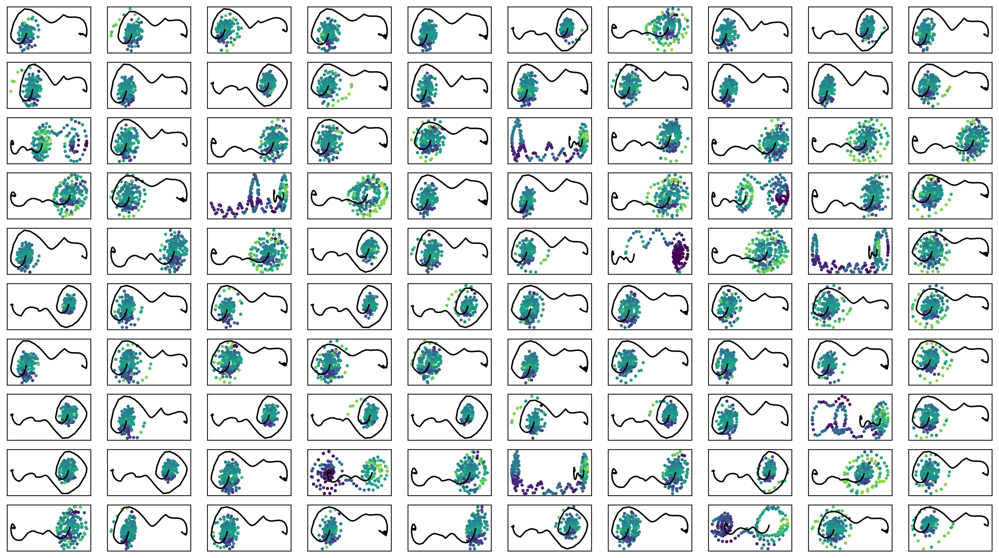

In [15]:

def f(x):
#     return x
    return np.log10(x)

fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter1.png")

In [19]:
train_curve1, valid_curve1 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()

train_curve2, valid_curve2 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()

train_curve3, valid_curve3 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()

weight_alpha 0.1
train_weighted_vae: enc_dec
train: iter 0  trainloss -387.99592  validloss -499.31108±0.00000  bestvalidloss -499.31108  last_update 0
train: iter 1  trainloss -400.99604  validloss -488.46753±0.00000  bestvalidloss -499.31108  last_update 1
train: iter 2  trainloss -384.72808  validloss -472.79965±0.00000  bestvalidloss -499.31108  last_update 2
train: iter 3  trainloss -408.95094  validloss -472.08301±0.00000  bestvalidloss -499.31108  last_update 3
train: iter 4  trainloss -411.50947  validloss -480.79194±0.00000  bestvalidloss -499.31108  last_update 4
train: iter 5  trainloss -398.66987  validloss -485.07950±0.00000  bestvalidloss -499.31108  last_update 5
train: iter 6  trainloss -393.88886  validloss -468.36545±0.00000  bestvalidloss -499.31108  last_update 6
train: iter 7  trainloss -391.17646  validloss -461.47580±0.00000  bestvalidloss -499.31108  last_update 7
train: iter 8  trainloss -407.36861  validloss -479.41505±0.00000  bestvalidloss -499.31108  last_u

train: iter 76  trainloss -423.44929  validloss -504.14216±0.00000  bestvalidloss -509.27455  last_update 18
train: iter 77  trainloss -426.96028  validloss -497.98878±0.00000  bestvalidloss -509.27455  last_update 19
train: iter 78  trainloss -432.47734  validloss -511.74981±0.00000  bestvalidloss -511.74981  last_update 0
train: iter 79  trainloss -430.40572  validloss -505.47549±0.00000  bestvalidloss -511.74981  last_update 1
train: iter 80  trainloss -419.48691  validloss -500.69797±0.00000  bestvalidloss -511.74981  last_update 2
train: iter 81  trainloss -429.70645  validloss -489.17376±0.00000  bestvalidloss -511.74981  last_update 3
train: iter 82  trainloss -430.50153  validloss -498.07883±0.00000  bestvalidloss -511.74981  last_update 4
train: iter 83  trainloss -434.92670  validloss -495.74573±0.00000  bestvalidloss -511.74981  last_update 5
train: iter 84  trainloss -429.54709  validloss -503.04502±0.00000  bestvalidloss -511.74981  last_update 6
train: iter 85  trainloss 

train: iter 152  trainloss -459.86900  validloss -528.69940±0.00000  bestvalidloss -532.65428  last_update 17
train: iter 153  trainloss -457.18610  validloss -533.90942±0.00000  bestvalidloss -533.90942  last_update 0
train: iter 154  trainloss -460.50648  validloss -493.48251±0.00000  bestvalidloss -533.90942  last_update 1
train: iter 155  trainloss -449.36643  validloss -486.04025±0.00000  bestvalidloss -533.90942  last_update 2
train: iter 156  trainloss -465.65017  validloss -518.22641±0.00000  bestvalidloss -533.90942  last_update 3
train: iter 157  trainloss -461.60340  validloss -533.84816±0.00000  bestvalidloss -533.90942  last_update 4
train: iter 158  trainloss -456.58785  validloss -551.77903±0.00000  bestvalidloss -551.77903  last_update 0
train: iter 159  trainloss -458.62162  validloss -527.15706±0.00000  bestvalidloss -551.77903  last_update 1
train: iter 160  trainloss -462.65072  validloss -525.07861±0.00000  bestvalidloss -551.77903  last_update 2
train: iter 161  t

train: iter 227  trainloss -493.38624  validloss -547.05653±0.00000  bestvalidloss -569.27767  last_update 4
train: iter 228  trainloss -492.82240  validloss -540.82979±0.00000  bestvalidloss -569.27767  last_update 5
train: iter 229  trainloss -488.06853  validloss -547.13017±0.00000  bestvalidloss -569.27767  last_update 6
train: iter 230  trainloss -488.50737  validloss -556.48411±0.00000  bestvalidloss -569.27767  last_update 7
train: iter 231  trainloss -487.50922  validloss -546.60394±0.00000  bestvalidloss -569.27767  last_update 8
train: iter 232  trainloss -472.01389  validloss -575.92795±0.00000  bestvalidloss -575.92795  last_update 0
train: iter 233  trainloss -480.26785  validloss -566.90829±0.00000  bestvalidloss -575.92795  last_update 1
train: iter 234  trainloss -500.61410  validloss -552.63381±0.00000  bestvalidloss -575.92795  last_update 2
train: iter 235  trainloss -485.89280  validloss -536.43366±0.00000  bestvalidloss -575.92795  last_update 3
train: iter 236  tr

train: iter 302  trainloss -527.39955  validloss -586.08345±0.00000  bestvalidloss -611.11509  last_update 1
train: iter 303  trainloss -516.38761  validloss -577.05077±0.00000  bestvalidloss -611.11509  last_update 2
train: iter 304  trainloss -526.51277  validloss -603.57513±0.00000  bestvalidloss -611.11509  last_update 3
train: iter 305  trainloss -520.10238  validloss -591.03102±0.00000  bestvalidloss -611.11509  last_update 4
train: iter 306  trainloss -507.30156  validloss -596.41808±0.00000  bestvalidloss -611.11509  last_update 5
train: iter 307  trainloss -532.05431  validloss -599.08767±0.00000  bestvalidloss -611.11509  last_update 6
train: iter 308  trainloss -521.47404  validloss -622.69259±0.00000  bestvalidloss -622.69259  last_update 0
train: iter 309  trainloss -518.66373  validloss -589.10069±0.00000  bestvalidloss -622.69259  last_update 1
train: iter 310  trainloss -529.88644  validloss -600.88336±0.00000  bestvalidloss -622.69259  last_update 2
train: iter 311  tr

train: iter 377  trainloss -588.81243  validloss -669.41964±0.00000  bestvalidloss -699.20438  last_update 1
train: iter 378  trainloss -605.99226  validloss -687.42475±0.00000  bestvalidloss -699.20438  last_update 2
train: iter 379  trainloss -607.46584  validloss -684.68645±0.00000  bestvalidloss -699.20438  last_update 3
train: iter 380  trainloss -596.79189  validloss -709.33896±0.00000  bestvalidloss -709.33896  last_update 0
train: iter 381  trainloss -598.14624  validloss -628.51385±0.00000  bestvalidloss -709.33896  last_update 1
train: iter 382  trainloss -610.29579  validloss -719.48297±0.00000  bestvalidloss -719.48297  last_update 0
train: iter 383  trainloss -592.05665  validloss -683.91923±0.00000  bestvalidloss -719.48297  last_update 1
train: iter 384  trainloss -608.52165  validloss -693.10066±0.00000  bestvalidloss -719.48297  last_update 2
train: iter 385  trainloss -598.37489  validloss -675.14681±0.00000  bestvalidloss -719.48297  last_update 3
train: iter 386  tr

train: iter 453  trainloss -651.56386  validloss -775.38608±0.00000  bestvalidloss -775.38608  last_update 0
train: iter 454  trainloss -657.42135  validloss -727.23918±0.00000  bestvalidloss -775.38608  last_update 1
train: iter 455  trainloss -647.89457  validloss -741.61343±0.00000  bestvalidloss -775.38608  last_update 2
train: iter 456  trainloss -643.33248  validloss -766.40121±0.00000  bestvalidloss -775.38608  last_update 3
train: iter 457  trainloss -653.41466  validloss -742.00410±0.00000  bestvalidloss -775.38608  last_update 4
train: iter 458  trainloss -657.78979  validloss -757.61681±0.00000  bestvalidloss -775.38608  last_update 5
train: iter 459  trainloss -657.98420  validloss -754.60845±0.00000  bestvalidloss -775.38608  last_update 6
train: iter 460  trainloss -655.27143  validloss -748.26769±0.00000  bestvalidloss -775.38608  last_update 7
train: iter 461  trainloss -648.19108  validloss -768.61630±0.00000  bestvalidloss -775.38608  last_update 8
train: iter 462  tr

train: iter 528  trainloss -674.30713  validloss -776.62260±0.00000  bestvalidloss -790.31575  last_update 5
train: iter 529  trainloss -680.03727  validloss -663.93181±0.00000  bestvalidloss -790.31575  last_update 6
train: iter 530  trainloss -685.23450  validloss -791.52278±0.00000  bestvalidloss -791.52278  last_update 0
train: iter 531  trainloss -647.41657  validloss -752.58655±0.00000  bestvalidloss -791.52278  last_update 1
train: iter 532  trainloss -679.78973  validloss -766.63019±0.00000  bestvalidloss -791.52278  last_update 2
train: iter 533  trainloss -682.98307  validloss -794.27585±0.00000  bestvalidloss -794.27585  last_update 0
train: iter 534  trainloss -668.53448  validloss -795.01449±0.00000  bestvalidloss -795.01449  last_update 0
train: iter 535  trainloss -685.67888  validloss -796.32912±0.00000  bestvalidloss -796.32912  last_update 0
train: iter 536  trainloss -690.19193  validloss -765.69338±0.00000  bestvalidloss -796.32912  last_update 1
train: iter 537  tr

train: iter 603  trainloss -679.78279  validloss -806.26953±0.00000  bestvalidloss -826.10146  last_update 2
train: iter 604  trainloss -694.71925  validloss -803.76068±0.00000  bestvalidloss -826.10146  last_update 3
train: iter 605  trainloss -707.28604  validloss -802.42543±0.00000  bestvalidloss -826.10146  last_update 4
train: iter 606  trainloss -699.82086  validloss -788.30149±0.00000  bestvalidloss -826.10146  last_update 5
train: iter 607  trainloss -682.68326  validloss -799.93770±0.00000  bestvalidloss -826.10146  last_update 6
train: iter 608  trainloss -686.24856  validloss -785.66956±0.00000  bestvalidloss -826.10146  last_update 7
train: iter 609  trainloss -699.79343  validloss -792.25305±0.00000  bestvalidloss -826.10146  last_update 8
train: iter 610  trainloss -694.75490  validloss -624.00192±0.00000  bestvalidloss -826.10146  last_update 9
train: iter 611  trainloss -691.60790  validloss -799.34636±0.00000  bestvalidloss -826.10146  last_update 10
train: iter 612  t

train: iter 678  trainloss -701.89236  validloss -802.26942±0.00000  bestvalidloss -833.29659  last_update 1
train: iter 679  trainloss -698.82621  validloss -809.10712±0.00000  bestvalidloss -833.29659  last_update 2
train: iter 680  trainloss -717.73253  validloss -825.97325±0.00000  bestvalidloss -833.29659  last_update 3
train: iter 681  trainloss -708.28372  validloss -802.01574±0.00000  bestvalidloss -833.29659  last_update 4
train: iter 682  trainloss -688.22654  validloss -812.74488±0.00000  bestvalidloss -833.29659  last_update 5
train: iter 683  trainloss -712.59197  validloss -822.77924±0.00000  bestvalidloss -833.29659  last_update 6
train: iter 684  trainloss -715.82160  validloss -839.50887±0.00000  bestvalidloss -839.50887  last_update 0
train: iter 685  trainloss -718.00618  validloss -840.13187±0.00000  bestvalidloss -840.13187  last_update 0
train: iter 686  trainloss -700.41463  validloss -823.36513±0.00000  bestvalidloss -840.13187  last_update 1
train: iter 687  tr

train: iter 753  trainloss -726.38875  validloss -830.71150±0.00000  bestvalidloss -850.28716  last_update 18
train: iter 754  trainloss -697.51963  validloss -850.99955±0.00000  bestvalidloss -850.99955  last_update 0
train: iter 755  trainloss -729.79313  validloss -843.37527±0.00000  bestvalidloss -850.99955  last_update 1
train: iter 756  trainloss -723.50237  validloss -813.01950±0.00000  bestvalidloss -850.99955  last_update 2
train: iter 757  trainloss -716.21719  validloss -828.08000±0.00000  bestvalidloss -850.99955  last_update 3
train: iter 758  trainloss -700.88226  validloss -758.71038±0.00000  bestvalidloss -850.99955  last_update 4
train: iter 759  trainloss -734.90195  validloss -805.21591±0.00000  bestvalidloss -850.99955  last_update 5
train: iter 760  trainloss -732.75334  validloss -838.55764±0.00000  bestvalidloss -850.99955  last_update 6
train: iter 761  trainloss -724.34170  validloss -773.15055±0.00000  bestvalidloss -850.99955  last_update 7
train: iter 762  t

train: iter 828  trainloss -741.00107  validloss -831.57735±0.00000  bestvalidloss -873.32627  last_update 59
train: iter 829  trainloss -697.71798  validloss -838.87185±0.00000  bestvalidloss -873.32627  last_update 60
train: iter 830  trainloss -743.45495  validloss -836.27812±0.00000  bestvalidloss -873.32627  last_update 61
train: iter 831  trainloss -723.86338  validloss -715.63805±0.00000  bestvalidloss -873.32627  last_update 62
train: iter 832  trainloss -732.60526  validloss -858.56638±0.00000  bestvalidloss -873.32627  last_update 63
train: iter 833  trainloss -738.26131  validloss -852.74429±0.00000  bestvalidloss -873.32627  last_update 64
train: iter 834  trainloss -741.25349  validloss -856.06623±0.00000  bestvalidloss -873.32627  last_update 65
train: iter 835  trainloss -733.12853  validloss -822.40934±0.00000  bestvalidloss -873.32627  last_update 66
train: iter 836  trainloss -712.12734  validloss -774.90645±0.00000  bestvalidloss -873.32627  last_update 67
train: ite

train: iter 903  trainloss -741.85802  validloss -839.90080±0.00000  bestvalidloss -888.30428  last_update 18
train: iter 904  trainloss -736.83605  validloss -838.47346±0.00000  bestvalidloss -888.30428  last_update 19
train: iter 905  trainloss -736.76247  validloss -868.58055±0.00000  bestvalidloss -888.30428  last_update 20
train: iter 906  trainloss -744.71542  validloss -877.82810±0.00000  bestvalidloss -888.30428  last_update 21
train: iter 907  trainloss -703.02055  validloss -855.57436±0.00000  bestvalidloss -888.30428  last_update 22
train: iter 908  trainloss -735.23293  validloss -864.94556±0.00000  bestvalidloss -888.30428  last_update 23
train: iter 909  trainloss -718.43086  validloss -885.27801±0.00000  bestvalidloss -888.30428  last_update 24
train: iter 910  trainloss -731.88164  validloss -834.70841±0.00000  bestvalidloss -888.30428  last_update 25
train: iter 911  trainloss -746.66617  validloss -843.58250±0.00000  bestvalidloss -888.30428  last_update 26
train: ite

train: iter 978  trainloss -742.57193  validloss -872.71302±0.00000  bestvalidloss -890.93678  last_update 14
train: iter 979  trainloss -769.74951  validloss -877.08865±0.00000  bestvalidloss -890.93678  last_update 15
train: iter 980  trainloss -762.07984  validloss -857.52852±0.00000  bestvalidloss -890.93678  last_update 16
train: iter 981  trainloss -757.51421  validloss -810.04288±0.00000  bestvalidloss -890.93678  last_update 17
train: iter 982  trainloss -766.78067  validloss -867.63830±0.00000  bestvalidloss -890.93678  last_update 18
train: iter 983  trainloss -754.61334  validloss -894.44764±0.00000  bestvalidloss -894.44764  last_update 0
train: iter 984  trainloss -754.34160  validloss -866.14432±0.00000  bestvalidloss -894.44764  last_update 1
train: iter 985  trainloss -767.66547  validloss -883.60282±0.00000  bestvalidloss -894.44764  last_update 2
train: iter 986  trainloss -759.72226  validloss -874.67092±0.00000  bestvalidloss -894.44764  last_update 3
train: iter 98

train: iter 1053  trainloss -774.54963  validloss -884.48231±0.00000  bestvalidloss -905.89595  last_update 15
train: iter 1054  trainloss -770.48990  validloss -821.68180±0.00000  bestvalidloss -905.89595  last_update 16
train: iter 1055  trainloss -770.84330  validloss -858.08931±0.00000  bestvalidloss -905.89595  last_update 17
train: iter 1056  trainloss -760.95284  validloss -884.34016±0.00000  bestvalidloss -905.89595  last_update 18
train: iter 1057  trainloss -776.12328  validloss -867.39347±0.00000  bestvalidloss -905.89595  last_update 19
train: iter 1058  trainloss -771.84978  validloss -876.79120±0.00000  bestvalidloss -905.89595  last_update 20
train: iter 1059  trainloss -767.68173  validloss -891.51372±0.00000  bestvalidloss -905.89595  last_update 21
train: iter 1060  trainloss -788.53494  validloss -866.77047±0.00000  bestvalidloss -905.89595  last_update 22
train: iter 1061  trainloss -763.90439  validloss -878.94098±0.00000  bestvalidloss -905.89595  last_update 23
t

train: iter 1128  trainloss -789.55391  validloss -897.83611±0.00000  bestvalidloss -912.79946  last_update 11
train: iter 1129  trainloss -788.01715  validloss -886.35844±0.00000  bestvalidloss -912.79946  last_update 12
train: iter 1130  trainloss -764.38051  validloss -856.75161±0.00000  bestvalidloss -912.79946  last_update 13
train: iter 1131  trainloss -772.33280  validloss -793.25760±0.00000  bestvalidloss -912.79946  last_update 14
train: iter 1132  trainloss -760.09601  validloss -893.68706±0.00000  bestvalidloss -912.79946  last_update 15
train: iter 1133  trainloss -771.24037  validloss -886.29642±0.00000  bestvalidloss -912.79946  last_update 16
train: iter 1134  trainloss -784.60173  validloss -834.32247±0.00000  bestvalidloss -912.79946  last_update 17
train: iter 1135  trainloss -773.28673  validloss -801.59424±0.00000  bestvalidloss -912.79946  last_update 18
train: iter 1136  trainloss -762.42155  validloss -853.60910±0.00000  bestvalidloss -912.79946  last_update 19
t

train: iter 1203  trainloss -796.91066  validloss -895.65532±0.00000  bestvalidloss -917.05362  last_update 15
train: iter 1204  trainloss -783.01308  validloss -876.28568±0.00000  bestvalidloss -917.05362  last_update 16
train: iter 1205  trainloss -770.53488  validloss -829.96003±0.00000  bestvalidloss -917.05362  last_update 17
train: iter 1206  trainloss -793.30933  validloss -860.94926±0.00000  bestvalidloss -917.05362  last_update 18
train: iter 1207  trainloss -786.54327  validloss -883.28613±0.00000  bestvalidloss -917.05362  last_update 19
train: iter 1208  trainloss -791.75409  validloss -893.29238±0.00000  bestvalidloss -917.05362  last_update 20
train: iter 1209  trainloss -785.27537  validloss -908.48813±0.00000  bestvalidloss -917.05362  last_update 21
train: iter 1210  trainloss -783.22863  validloss -878.88721±0.00000  bestvalidloss -917.05362  last_update 22
train: iter 1211  trainloss -786.95828  validloss -757.02739±0.00000  bestvalidloss -917.05362  last_update 23
t

train: iter 1277  trainloss -786.36705  validloss -893.74113±0.00000  bestvalidloss -917.05362  last_update 89
train: iter 1278  trainloss -790.24692  validloss -856.40901±0.00000  bestvalidloss -917.05362  last_update 90
train: iter 1279  trainloss -785.65250  validloss -883.85602±0.00000  bestvalidloss -917.05362  last_update 91
train: iter 1280  trainloss -760.98187  validloss -826.35649±0.00000  bestvalidloss -917.05362  last_update 92
train: iter 1281  trainloss -756.81554  validloss -838.74596±0.00000  bestvalidloss -917.05362  last_update 93
train: iter 1282  trainloss -796.80255  validloss -898.93383±0.00000  bestvalidloss -917.05362  last_update 94
train: iter 1283  trainloss -801.86051  validloss -830.06691±0.00000  bestvalidloss -917.05362  last_update 95
train: iter 1284  trainloss -785.61917  validloss -896.02346±0.00000  bestvalidloss -917.05362  last_update 96
train: iter 1285  trainloss -799.77336  validloss -857.55664±0.00000  bestvalidloss -917.05362  last_update 97
t

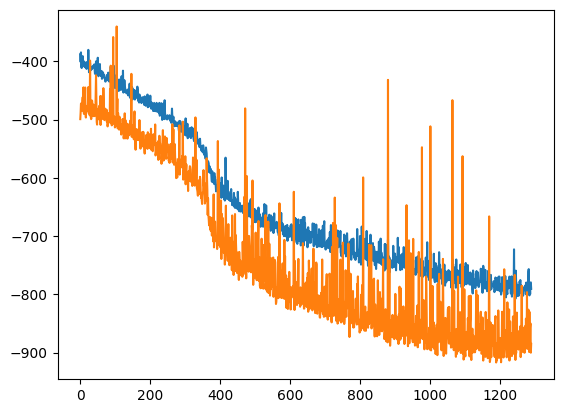

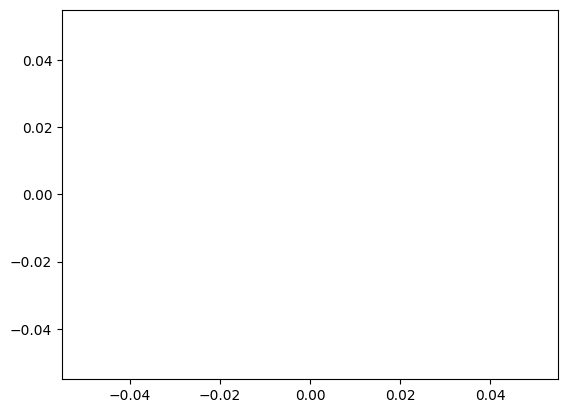

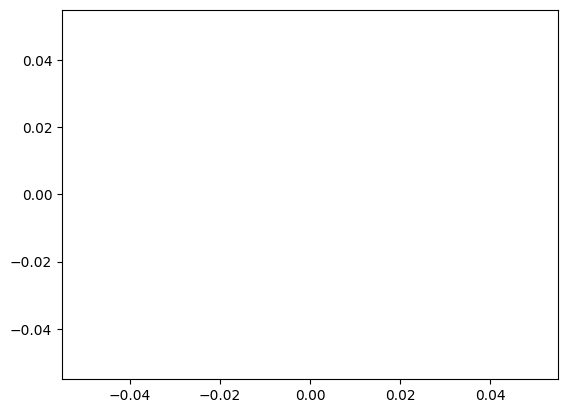

alpha 0.1 vae_lr 0.0005


In [20]:
plt.plot(train_curve1)
plt.plot(valid_curve1)
plt.show()

plt.plot(train_curve2)
plt.plot(valid_curve2)
plt.show()

plt.plot(train_curve3)
plt.plot(valid_curve3)
plt.show()
print("alpha",alpha, "vae_lr", vae_lr)

In [21]:
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
# simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0d = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0e = copy.deepcopy(iwvi.simenv_rolloutdata)




 0 7.152557373046875e-07

 1 3.1610496044158936

 2 3.108576774597168

 3 3.19197416305542

 4 3.354416847229004

 5 3.1082959175109863

 6 3.600595712661743
predict diverge [13.6295242  37.81377612] [ 0.37479009 27.69135181] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 38

 7 0.6003363132476807

 8 3.130018472671509

 9 3.0823121070861816

 10 3.3019583225250244

 11 3.1183395385742188

 12 3.153576612472534

 13 3.3223752975463867

 14 3.1490933895111084

 15 3.1281495094299316

 16 3.2287046909332275

 17 3.2178609371185303

 18 3.254575490951538

 19 3.158046007156372

 20 3.0766217708587646
predict diverge [ 16.74031131 -57.23715939] [  0.77582045 -54.33531765] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 34

 21 0.5790410041809082

 22 3.1643855571746826
predict diverge [13.46468915 44.53056544] [ 0.94088597 36.05077238] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 36

 23 0.612842321395874
predict diverge [13.25217374 28.97333638] [ 0.75673894 23.1988307

predict diverge [12.54891915 23.74146773] [ 1.11993883 11.50164019] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 41

 31 0.7006011009216309

 32 3.1790616512298584
predict diverge [15.73210496 57.62261232] [ 2.11118326 48.05170054] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 46

 33 0.8174688816070557
predict diverge [13.19801498 30.3228232 ] [-0.28285776 34.65109803] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 42

 34 0.6541781425476074

 35 3.191183567047119

 36 3.233515739440918
predict diverge [ 16.1045585  192.34296203] [  0.99437648 188.52030497] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 38

 37 0.6394248008728027
predict diverge [13.91852936 36.80549575] [ 0.89840906 23.57637293] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 54

 38 0.8255219459533691
predict diverge [  13.68949731 -143.76216715] [  -0.26367245 -130.94469845] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 64

 39 0.9969742298126221

 40 3.049309015274048

 41 3.

実環境方策rollout vs Sim環境方策rollout


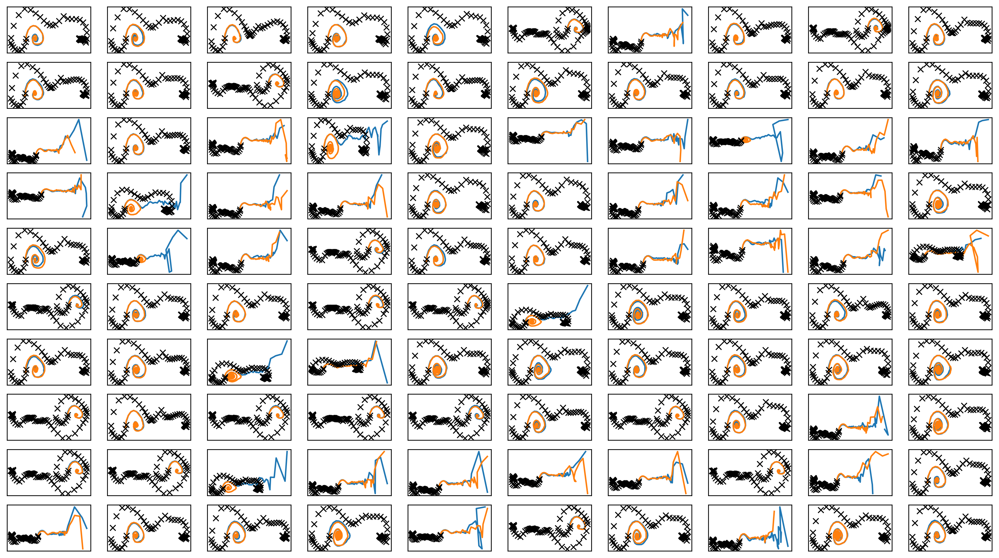

In [22]:
fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
#     ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"iter1.png")
plt.savefig(figfilenamehead+"iter1.eps")
# plt.savefig(figfilenamehead+"iter1.pdf")
print("実環境方策rollout vs Sim環境方策rollout")

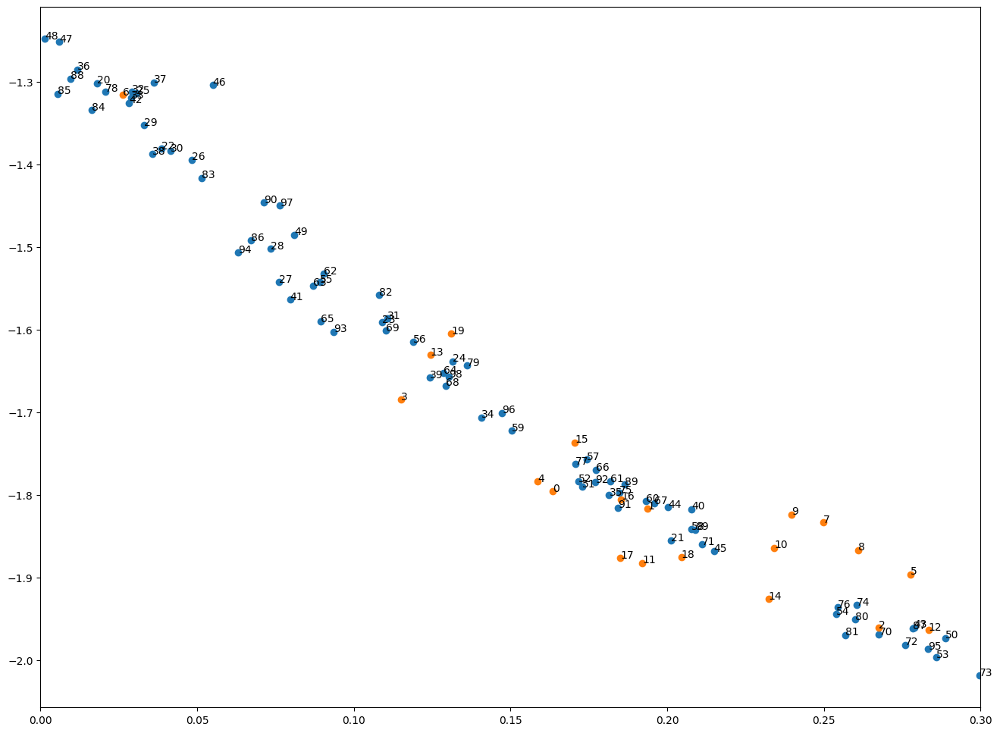

[0.16346495 0.19376823 0.2675319  0.11503246 0.15866848 0.27767899
 0.02613879 0.24978595 0.26100364 0.23974757]
[0.23415875 0.19197631 0.28340068 0.12439858 0.23227011 0.17053018
 0.18529065 0.1850802  0.20454609 0.13110959]
[0.01806764 0.20119136 0.03867789 0.10911323 0.13158045 0.03061344
 0.04839286 0.07598748 0.07332768 0.03311254]
[0.04145489 0.11061755 0.02913038 0.02882952 0.14059536 0.18145366
 0.01175634 0.03605897 0.03561832 0.1242789 ]
[0.20774164 0.07961685 0.02818215 0.27878886 0.20022311 0.21489816
 0.05495741 0.00603226 0.00140864 0.08100239]
[0.28865656 0.1728472  0.17167557 0.2858247  0.2539226  0.08923109
 0.11895172 0.17438186 0.20775948 0.15039731]
[0.19319706 0.18191796 0.09047245 0.08702328 0.12863061 0.0894847
 0.17726183 0.19596025 0.12942553 0.11026856]
[0.26757701 0.21116658 0.27584478 0.2996541  0.26043782 0.18466787
 0.25440247 0.17073022 0.0207501  0.1360628 ]
[0.2599147  0.256741   0.10799342 0.0514889  0.0163014  0.00555654
 0.06717741 0.27842439 0.00955

In [23]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter1.png")
plt.savefig(figfilenamehead+"damping_latent_iter1.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter1.pdf")
plt.show()

# plt.figure(figsize=(16,12))
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.xlim([0.06,0.14])
# plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [24]:
print(datetime.datetime.now())

2023-05-10 20:53:44.589621


# Iter2

In [25]:
iwvi.get_sim_rollout_bamdppolicy_data_randomstop()


 0
predict diverge [11.53562337 22.30436297] [-0.29890129 27.56314384] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 37
predict diverge [11.3725963  24.96360797] [-0.70544233 39.1296569 ] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 51

 1

 2

 3
predict diverge [13.31741156 25.74587731] [ 0.03180018 23.04164573] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 66
predict diverge [13.87693973 38.29050199] [ 1.3986191  23.36534345] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 47

 4

 5

 6
predict diverge [ 12.28995119 170.01958003] [ -1.89046065 179.80551281] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 51
predict diverge [ 15.05916983 -33.62741442] [ -0.0700033  -48.97578189] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 57
predict diverge [14.26521434 79.86951981] [ 0.86345116 70.13609263] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 40
predict diverge [12.67384398 33.35424086] [ 1.18330881 21.12848245] [98.16052 20.     ] [49.0802

predict diverge [  16.6026607  -498.55445621] [   1.33875037 -481.87038533] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 56
predict diverge [15.89424663 65.63407571] [ 2.20493357 47.45633603] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 62
predict diverge [13.09788713 23.02744947] [ 1.34082338 15.77161376] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 83

 38
predict diverge [ 17.32078504 -48.91915944] [  1.18056406 -61.35436713] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 54

 39

 40

 41
predict diverge [10.75398137 75.084181  ] [-1.7928935  95.05409217] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 47

 42
predict diverge [14.16995266 34.31962559] [ 1.5859515  23.82483831] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 51
predict diverge [ 13.18572068 -20.24739296] [ -0.20202038 -19.9188428 ] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 45
predict diverge [ 12.13379762 -28.05959794] [ -0.33175658 -20.95721798] [98.16052 20.     ]

In [26]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)


train: iter 0  trainloss 1.55649  validloss 3.40435±0.00000  bestvalidloss 3.40435  last_update 0
train: iter 1  trainloss 0.62338  validloss 0.69704±0.00000  bestvalidloss 0.69704  last_update 0
train: iter 2  trainloss 0.44697  validloss 0.40212±0.00000  bestvalidloss 0.40212  last_update 0
train: iter 3  trainloss 0.37760  validloss 0.29349±0.00000  bestvalidloss 0.29349  last_update 0
train: iter 4  trainloss 0.34881  validloss 0.25430±0.00000  bestvalidloss 0.25430  last_update 0
train: iter 5  trainloss 0.33303  validloss 0.24376±0.00000  bestvalidloss 0.24376  last_update 0
train: iter 6  trainloss 0.32333  validloss 0.23046±0.00000  bestvalidloss 0.23046  last_update 0
train: iter 7  trainloss 0.31893  validloss 0.23033±0.00000  bestvalidloss 0.23033  last_update 0
train: iter 8  trainloss 0.30925  validloss 0.22998±0.00000  bestvalidloss 0.22998  last_update 0
train: iter 9  trainloss 0.30272  validloss 0.23930±0.00000  bestvalidloss 0.22998  last_update 1
train: iter 10  trai

train: iter 83  trainloss 0.22339  validloss 0.19468±0.00000  bestvalidloss 0.18305  last_update 1
train: iter 84  trainloss 0.22112  validloss 0.18352±0.00000  bestvalidloss 0.18305  last_update 2
train: iter 85  trainloss 0.22042  validloss 0.20123±0.00000  bestvalidloss 0.18305  last_update 3
train: iter 86  trainloss 0.21827  validloss 0.18235±0.00000  bestvalidloss 0.18235  last_update 0
train: iter 87  trainloss 0.21947  validloss 0.17817±0.00000  bestvalidloss 0.17817  last_update 0
train: iter 88  trainloss 0.21821  validloss 0.18452±0.00000  bestvalidloss 0.17817  last_update 1
train: iter 89  trainloss 0.21725  validloss 0.17996±0.00000  bestvalidloss 0.17817  last_update 2
train: iter 90  trainloss 0.21962  validloss 0.18141±0.00000  bestvalidloss 0.17817  last_update 3
train: iter 91  trainloss 0.21656  validloss 0.18102±0.00000  bestvalidloss 0.17817  last_update 4
train: iter 92  trainloss 0.21789  validloss 0.18352±0.00000  bestvalidloss 0.17817  last_update 5
train: ite

train: iter 165  trainloss 0.20127  validloss 0.17823±0.00000  bestvalidloss 0.17225  last_update 2
train: iter 166  trainloss 0.20159  validloss 0.17643±0.00000  bestvalidloss 0.17225  last_update 3
train: iter 167  trainloss 0.19895  validloss 0.17785±0.00000  bestvalidloss 0.17225  last_update 4
train: iter 168  trainloss 0.19986  validloss 0.17165±0.00000  bestvalidloss 0.17165  last_update 0
train: iter 169  trainloss 0.19979  validloss 0.17480±0.00000  bestvalidloss 0.17165  last_update 1
train: iter 170  trainloss 0.19878  validloss 0.17375±0.00000  bestvalidloss 0.17165  last_update 2
train: iter 171  trainloss 0.20090  validloss 0.17656±0.00000  bestvalidloss 0.17165  last_update 3
train: iter 172  trainloss 0.19823  validloss 0.17279±0.00000  bestvalidloss 0.17165  last_update 4
train: iter 173  trainloss 0.19750  validloss 0.17728±0.00000  bestvalidloss 0.17165  last_update 5
train: iter 174  trainloss 0.19909  validloss 0.17309±0.00000  bestvalidloss 0.17165  last_update 6


train: iter 247  trainloss 0.19031  validloss 0.16810±0.00000  bestvalidloss 0.16696  last_update 6
train: iter 248  trainloss 0.19264  validloss 0.16968±0.00000  bestvalidloss 0.16696  last_update 7
train: iter 249  trainloss 0.18970  validloss 0.17240±0.00000  bestvalidloss 0.16696  last_update 8
train: iter 250  trainloss 0.19026  validloss 0.17135±0.00000  bestvalidloss 0.16696  last_update 9
train: iter 251  trainloss 0.19178  validloss 0.17344±0.00000  bestvalidloss 0.16696  last_update 10
train: iter 252  trainloss 0.18902  validloss 0.16980±0.00000  bestvalidloss 0.16696  last_update 11
train: iter 253  trainloss 0.18969  validloss 0.17025±0.00000  bestvalidloss 0.16696  last_update 12
train: iter 254  trainloss 0.19116  validloss 0.16811±0.00000  bestvalidloss 0.16696  last_update 13
train: iter 255  trainloss 0.19130  validloss 0.16898±0.00000  bestvalidloss 0.16696  last_update 14
train: iter 256  trainloss 0.18935  validloss 0.18130±0.00000  bestvalidloss 0.16696  last_upda

train: iter 329  trainloss 0.18632  validloss 0.17018±0.00000  bestvalidloss 0.16584  last_update 5
train: iter 330  trainloss 0.18430  validloss 0.16956±0.00000  bestvalidloss 0.16584  last_update 6
train: iter 331  trainloss 0.18358  validloss 0.16961±0.00000  bestvalidloss 0.16584  last_update 7
train: iter 332  trainloss 0.18442  validloss 0.16878±0.00000  bestvalidloss 0.16584  last_update 8
train: iter 333  trainloss 0.18556  validloss 0.16575±0.00000  bestvalidloss 0.16575  last_update 0
train: iter 334  trainloss 0.18532  validloss 0.16694±0.00000  bestvalidloss 0.16575  last_update 1
train: iter 335  trainloss 0.18535  validloss 0.16849±0.00000  bestvalidloss 0.16575  last_update 2
train: iter 336  trainloss 0.18526  validloss 0.16769±0.00000  bestvalidloss 0.16575  last_update 3
train: iter 337  trainloss 0.18512  validloss 0.16630±0.00000  bestvalidloss 0.16575  last_update 4
train: iter 338  trainloss 0.18305  validloss 0.16596±0.00000  bestvalidloss 0.16575  last_update 5


train: iter 411  trainloss 0.18081  validloss 0.16481±0.00000  bestvalidloss 0.16330  last_update 18
train: iter 412  trainloss 0.18070  validloss 0.16725±0.00000  bestvalidloss 0.16330  last_update 19
train: iter 413  trainloss 0.17939  validloss 0.16461±0.00000  bestvalidloss 0.16330  last_update 20
train: iter 414  trainloss 0.17912  validloss 0.16507±0.00000  bestvalidloss 0.16330  last_update 21
train: iter 415  trainloss 0.18138  validloss 0.17021±0.00000  bestvalidloss 0.16330  last_update 22
train: iter 416  trainloss 0.17968  validloss 0.16616±0.00000  bestvalidloss 0.16330  last_update 23
train: iter 417  trainloss 0.17808  validloss 0.16483±0.00000  bestvalidloss 0.16330  last_update 24
train: iter 418  trainloss 0.18091  validloss 0.17025±0.00000  bestvalidloss 0.16330  last_update 25
train: iter 419  trainloss 0.18026  validloss 0.17463±0.00000  bestvalidloss 0.16330  last_update 26
train: iter 420  trainloss 0.18037  validloss 0.16606±0.00000  bestvalidloss 0.16330  last_

train: iter 493  trainloss 0.17513  validloss 0.16802±0.00000  bestvalidloss 0.16265  last_update 47
train: iter 494  trainloss 0.17699  validloss 0.16113±0.00000  bestvalidloss 0.16113  last_update 0
train: iter 495  trainloss 0.17595  validloss 0.16188±0.00000  bestvalidloss 0.16113  last_update 1
train: iter 496  trainloss 0.17708  validloss 0.16436±0.00000  bestvalidloss 0.16113  last_update 2
train: iter 497  trainloss 0.17519  validloss 0.17047±0.00000  bestvalidloss 0.16113  last_update 3
train: iter 498  trainloss 0.17621  validloss 0.16588±0.00000  bestvalidloss 0.16113  last_update 4
train: iter 499  trainloss 0.17474  validloss 0.16482±0.00000  bestvalidloss 0.16113  last_update 5
train: iter 500  trainloss 0.17644  validloss 0.16948±0.00000  bestvalidloss 0.16113  last_update 6
train: iter 501  trainloss 0.17708  validloss 0.16583±0.00000  bestvalidloss 0.16113  last_update 7
train: iter 502  trainloss 0.17647  validloss 0.16283±0.00000  bestvalidloss 0.16113  last_update 8

train: iter 575  trainloss 0.17184  validloss 0.16516±0.00000  bestvalidloss 0.16113  last_update 81
train: iter 576  trainloss 0.17094  validloss 0.16353±0.00000  bestvalidloss 0.16113  last_update 82
train: iter 577  trainloss 0.17204  validloss 0.16450±0.00000  bestvalidloss 0.16113  last_update 83
train: iter 578  trainloss 0.17158  validloss 0.16767±0.00000  bestvalidloss 0.16113  last_update 84
train: iter 579  trainloss 0.17203  validloss 0.16685±0.00000  bestvalidloss 0.16113  last_update 85
train: iter 580  trainloss 0.17142  validloss 0.16243±0.00000  bestvalidloss 0.16113  last_update 86
train: iter 581  trainloss 0.17224  validloss 0.16681±0.00000  bestvalidloss 0.16113  last_update 87
train: iter 582  trainloss 0.17226  validloss 0.16413±0.00000  bestvalidloss 0.16113  last_update 88
train: iter 583  trainloss 0.17274  validloss 0.16865±0.00000  bestvalidloss 0.16113  last_update 89
train: iter 584  trainloss 0.17076  validloss 0.16468±0.00000  bestvalidloss 0.16113  last_

([1.5564916394650936,
  0.6233842290937901,
  0.4469693509861827,
  0.3775950849056244,
  0.3488069461658597,
  0.3330290734767914,
  0.3233305484056473,
  0.3189315516501665,
  0.3092450864613056,
  0.30272354669868945,
  0.30121953021734954,
  0.2964678468182683,
  0.2905161987990141,
  0.2881120827049017,
  0.28223743103444576,
  0.27842076532542703,
  0.2762275462038815,
  0.2760001177899539,
  0.27062991745769976,
  0.26961268223822116,
  0.26799477692693474,
  0.26417020447552203,
  0.26418258966878055,
  0.2583431454375386,
  0.25649680458009244,
  0.2573435393162072,
  0.25932954233139754,
  0.2562427123077214,
  0.25803678296506405,
  0.25222888346761463,
  0.252684551756829,
  0.25156853841617705,
  0.24634418096393346,
  0.248771717492491,
  0.2491252644918859,
  0.2490497981198132,
  0.2450506690889597,
  0.24616300808265806,
  0.24294094890356063,
  0.24265158018097283,
  0.2473833085037768,
  0.24175446359440683,
  0.24016998801380396,
  0.236941338237375,
  0.24384978329

In [27]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


train_loss:  -180.6557551640272
valid_loss:  -151.48356356143955
train_loss:  -528.8279899668694
valid_loss:  -575.70287109375


1e-08 1000.0


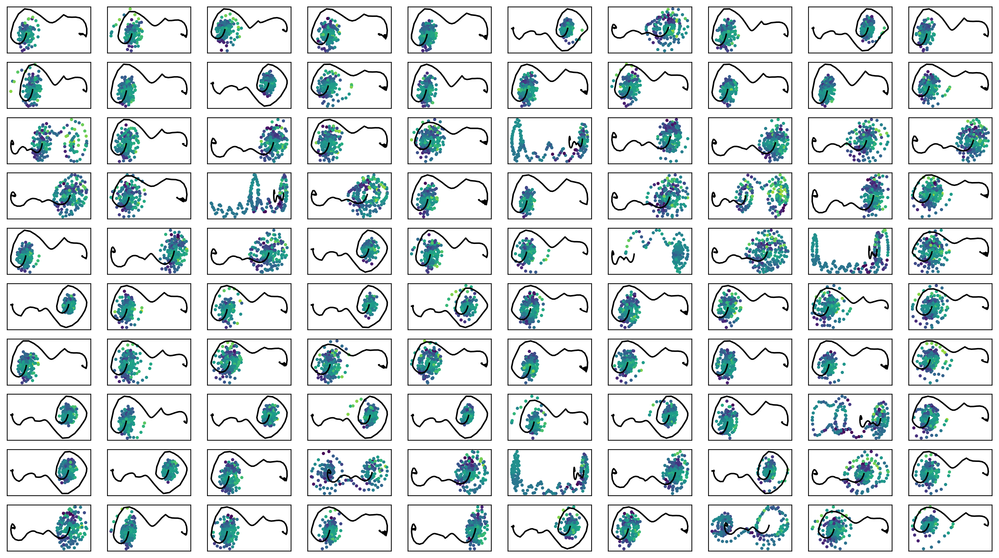

In [28]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter2.png")

In [31]:
train_curve1, valid_curve1 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()

train_curve2, valid_curve2 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()

train_curve3, valid_curve3 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()

weight_alpha 0.1
train_weighted_vae: enc_dec
train: iter 0  trainloss -519.72579  validloss -579.77353±0.00000  bestvalidloss -579.77353  last_update 0
train: iter 1  trainloss -513.30358  validloss -574.30875±0.00000  bestvalidloss -579.77353  last_update 1
train: iter 2  trainloss -512.40799  validloss -568.50051±0.00000  bestvalidloss -579.77353  last_update 2
train: iter 3  trainloss -514.63891  validloss -555.90876±0.00000  bestvalidloss -579.77353  last_update 3
train: iter 4  trainloss -513.18321  validloss -558.14872±0.00000  bestvalidloss -579.77353  last_update 4
train: iter 5  trainloss -524.42315  validloss -584.46629±0.00000  bestvalidloss -584.46629  last_update 0
train: iter 6  trainloss -523.83820  validloss -554.74779±0.00000  bestvalidloss -584.46629  last_update 1
train: iter 7  trainloss -525.26752  validloss -529.77383±0.00000  bestvalidloss -584.46629  last_update 2
train: iter 8  trainloss -515.40790  validloss -543.59081±0.00000  bestvalidloss -584.46629  last_u

train: iter 76  trainloss -520.69353  validloss -595.21454±0.00000  bestvalidloss -595.21454  last_update 0
train: iter 77  trainloss -519.77708  validloss -586.77245±0.00000  bestvalidloss -595.21454  last_update 1
train: iter 78  trainloss -528.48969  validloss -575.74744±0.00000  bestvalidloss -595.21454  last_update 2
train: iter 79  trainloss -528.88766  validloss -586.28127±0.00000  bestvalidloss -595.21454  last_update 3
train: iter 80  trainloss -526.81013  validloss -571.01369±0.00000  bestvalidloss -595.21454  last_update 4
train: iter 81  trainloss -529.93235  validloss -580.61068±0.00000  bestvalidloss -595.21454  last_update 5
train: iter 82  trainloss -521.38775  validloss -557.93349±0.00000  bestvalidloss -595.21454  last_update 6
train: iter 83  trainloss -527.04488  validloss -563.74229±0.00000  bestvalidloss -595.21454  last_update 7
train: iter 84  trainloss -519.62840  validloss -552.72761±0.00000  bestvalidloss -595.21454  last_update 8
train: iter 85  trainloss -5

train: iter 151  trainloss -532.18526  validloss -566.57286±0.00000  bestvalidloss -597.71666  last_update 38
train: iter 152  trainloss -510.83479  validloss -548.36216±0.00000  bestvalidloss -597.71666  last_update 39
train: iter 153  trainloss -530.22557  validloss -579.68305±0.00000  bestvalidloss -597.71666  last_update 40
train: iter 154  trainloss -522.31495  validloss -562.35761±0.00000  bestvalidloss -597.71666  last_update 41
train: iter 155  trainloss -525.40369  validloss -571.41462±0.00000  bestvalidloss -597.71666  last_update 42
train: iter 156  trainloss -515.89827  validloss -520.92232±0.00000  bestvalidloss -597.71666  last_update 43
train: iter 157  trainloss -527.30398  validloss -558.21055±0.00000  bestvalidloss -597.71666  last_update 44
train: iter 158  trainloss -535.30998  validloss -585.53050±0.00000  bestvalidloss -597.71666  last_update 45
train: iter 159  trainloss -534.85767  validloss -578.52301±0.00000  bestvalidloss -597.71666  last_update 46
train: ite

train: iter 226  trainloss -524.13190  validloss -579.31231±0.00000  bestvalidloss -598.83836  last_update 16
train: iter 227  trainloss -532.53172  validloss -565.51277±0.00000  bestvalidloss -598.83836  last_update 17
train: iter 228  trainloss -533.74474  validloss -587.79879±0.00000  bestvalidloss -598.83836  last_update 18
train: iter 229  trainloss -536.39498  validloss -544.03920±0.00000  bestvalidloss -598.83836  last_update 19
train: iter 230  trainloss -528.40982  validloss -551.58046±0.00000  bestvalidloss -598.83836  last_update 20
train: iter 231  trainloss -533.23300  validloss -566.18825±0.00000  bestvalidloss -598.83836  last_update 21
train: iter 232  trainloss -532.55105  validloss -549.57273±0.00000  bestvalidloss -598.83836  last_update 22
train: iter 233  trainloss -537.73834  validloss -584.01259±0.00000  bestvalidloss -598.83836  last_update 23
train: iter 234  trainloss -535.88171  validloss -525.88342±0.00000  bestvalidloss -598.83836  last_update 24
train: ite

train: iter 301  trainloss -539.27645  validloss -554.77827±0.00000  bestvalidloss -598.83836  last_update 91
train: iter 302  trainloss -538.85347  validloss -584.21736±0.00000  bestvalidloss -598.83836  last_update 92
train: iter 303  trainloss -534.45023  validloss -577.27171±0.00000  bestvalidloss -598.83836  last_update 93
train: iter 304  trainloss -531.89010  validloss -565.05612±0.00000  bestvalidloss -598.83836  last_update 94
train: iter 305  trainloss -531.10265  validloss -579.56906±0.00000  bestvalidloss -598.83836  last_update 95
train: iter 306  trainloss -536.93633  validloss -568.46940±0.00000  bestvalidloss -598.83836  last_update 96
train: iter 307  trainloss -537.02983  validloss -584.47901±0.00000  bestvalidloss -598.83836  last_update 97
train: iter 308  trainloss -536.84507  validloss -570.11813±0.00000  bestvalidloss -598.83836  last_update 98
train: iter 309  trainloss -526.81429  validloss -586.52658±0.00000  bestvalidloss -598.83836  last_update 99
train: ite

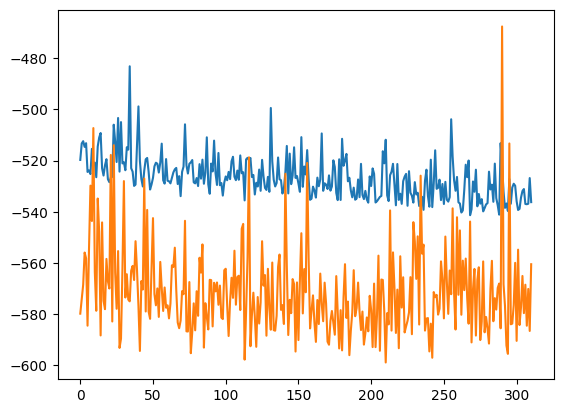

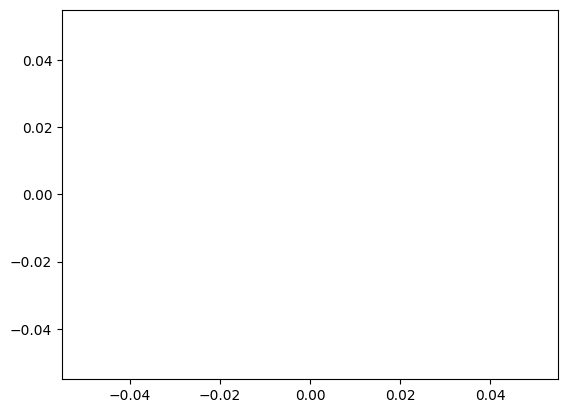

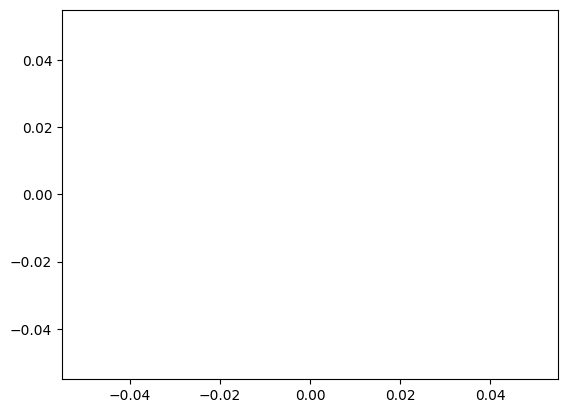

alpha 0.1 vae_lr 0.0005


In [32]:
plt.plot(train_curve1)
plt.plot(valid_curve1)
plt.show()

plt.plot(train_curve2)
plt.plot(valid_curve2)
plt.show()

plt.plot(train_curve3)
plt.plot(valid_curve3)
plt.show()
print("alpha",alpha, "vae_lr", vae_lr)

In [33]:
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
# simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)



 0 7.152557373046875e-07

 1 3.7202062606811523

 2 3.687560558319092

 3 3.5819740295410156

 4 3.5374526977539062

 5 3.5871634483337402

 6 3.414440393447876
predict diverge [ 10.37938383 -26.10676868] [-1.42501036 -9.08733069] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 36

 7 0.6503884792327881

 8 3.6081812381744385

 9 3.5956294536590576

 10 3.5184431076049805

 11 3.4606382846832275

 12 3.66774845123291

 13 3.478943347930908

 14 3.701944351196289

 15 3.8137433528900146

 16 3.6159377098083496

 17 3.7776739597320557

 18 3.6196088790893555

 19 3.531130313873291

 20 3.5442707538604736
predict diverge [16.62777692 27.23179895] [ 1.74583774 13.16483465] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 44

 21 0.7714602947235107

 22 3.607919931411743
predict diverge [13.07041998 21.80965507] [ 1.07885092 13.6560223 ] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 42

 23 0.7614731788635254
predict diverge [16.20789847 70.58564367] [ 1.39165408 55.0972938


 25 3.4551353454589844
predict diverge [11.10983523 22.41400454] [ 0.42734463 15.23632111] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 37

 26 0.6956543922424316
predict diverge [11.91663743 23.78826077] [ 0.75584659 18.15825236] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 62

 27 1.3451435565948486
predict diverge [13.32870865 23.09008647] [1.22290385 8.86339906] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 43

 28 0.8304755687713623
predict diverge [12.84865292 27.19862336] [ 0.9142341  16.34403535] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 45

 29 0.9354648590087891
predict diverge [12.79778797 20.12220846] [1.32130488 7.58922732] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 38

 30 0.6907238960266113
predict diverge [12.25487372 25.16962121] [ 1.10389846 18.21709778] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 51

 31 0.9082155227661133

 32 3.557264566421509
predict diverge [12.03277646 22.2984537 ] [ 0.98369472 12.81722469] [

実環境方策rollout vs Sim環境方策rollout


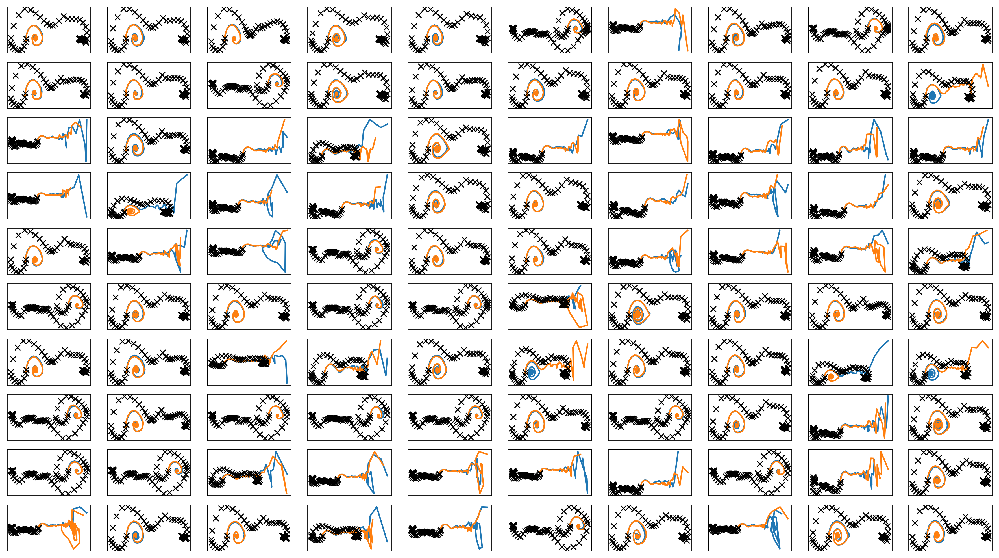

In [34]:

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
#     ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter2.png")
plt.savefig(figfilenamehead+"joint_iter2.eps")
# plt.savefig(figfilenamehead+"joint_iter2.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

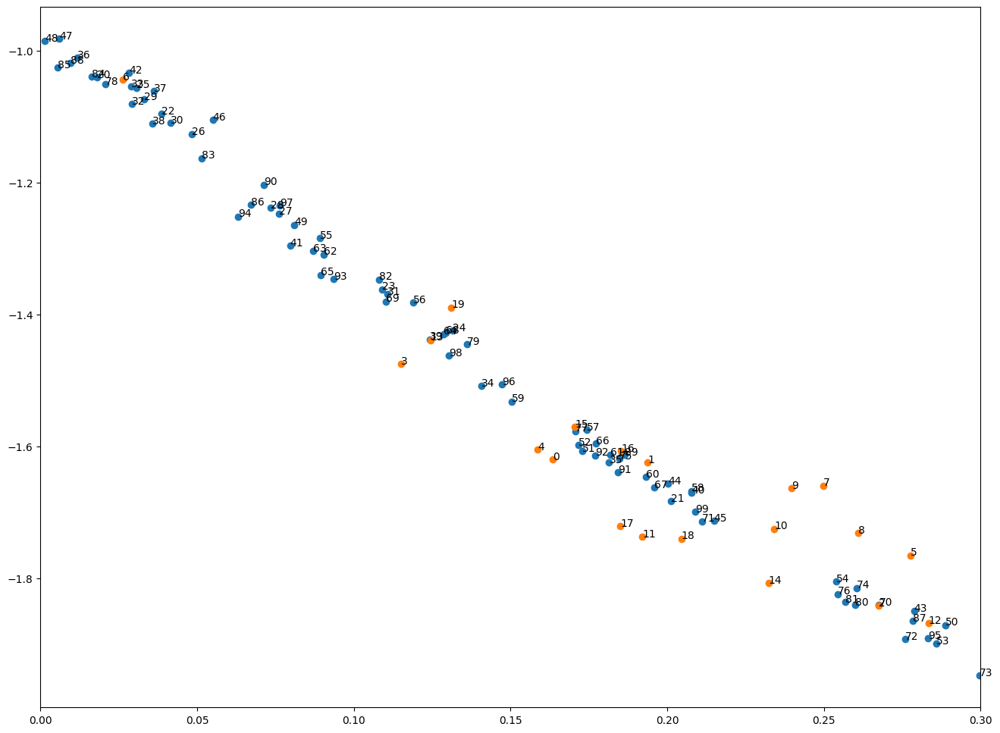

[0.16346495 0.19376823 0.2675319  0.11503246 0.15866848 0.27767899
 0.02613879 0.24978595 0.26100364 0.23974757]
[0.23415875 0.19197631 0.28340068 0.12439858 0.23227011 0.17053018
 0.18529065 0.1850802  0.20454609 0.13110959]
[0.01806764 0.20119136 0.03867789 0.10911323 0.13158045 0.03061344
 0.04839286 0.07598748 0.07332768 0.03311254]
[0.04145489 0.11061755 0.02913038 0.02882952 0.14059536 0.18145366
 0.01175634 0.03605897 0.03561832 0.1242789 ]
[0.20774164 0.07961685 0.02818215 0.27878886 0.20022311 0.21489816
 0.05495741 0.00603226 0.00140864 0.08100239]
[0.28865656 0.1728472  0.17167557 0.2858247  0.2539226  0.08923109
 0.11895172 0.17438186 0.20775948 0.15039731]
[0.19319706 0.18191796 0.09047245 0.08702328 0.12863061 0.0894847
 0.17726183 0.19596025 0.12942553 0.11026856]
[0.26757701 0.21116658 0.27584478 0.2996541  0.26043782 0.18466787
 0.25440247 0.17073022 0.0207501  0.1360628 ]
[0.2599147  0.256741   0.10799342 0.0514889  0.0163014  0.00555654
 0.06717741 0.27842439 0.00955

In [35]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter2.png")
plt.savefig(figfilenamehead+"damping_latent_iter2.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter2.pdf")
plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [36]:
print(datetime.datetime.now())

2023-05-10 21:26:27.276360


# Iter 3

In [37]:
iwvi.get_sim_rollout_bamdppolicy_data_randomstop()


 0
predict diverge [ 15.72920243 107.0695149 ] [  0.33990134 103.58756103] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 36
predict diverge [13.59929339 21.32505111] [ 0.51079974 20.16028392] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 46

 1

 2
predict diverge [14.10190895 58.688715  ] [ 0.87106705 50.39478262] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 68

 3
predict diverge [ 17.42130401 368.31517443] [  1.30608906 351.41764215] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 57
predict diverge [11.93421949 30.48009732] [ 0.53619101 24.11851492] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 50
predict diverge [ 12.51015098 -24.81881226] [  0.59078755 -30.22121389] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 67
predict diverge [11.90285388 21.21199721] [ 0.58633728 13.36198078] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 47
predict diverge [13.58702725 24.35617037] [1.84724815 7.92898006] [98.16052 20.     ] [49.08026 10.     

predict diverge [16.43706515 49.65054774] [ 0.2500745 63.3542064] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 56
predict diverge [12.38292067 34.24607375] [ 0.41249092 27.09096766] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 57

 34

 35

 36
predict diverge [13.02417765 20.39780185] [1.64600439 5.72115471] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 59
predict diverge [11.50284752 22.84783   ] [-0.05033697 19.25617185] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 46
predict diverge [12.26254001 22.48767996] [ 0.43038858 19.20495062] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 61
predict diverge [13.56331155 43.71539548] [ 0.69258026 34.25364281] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 49
predict diverge [ 12.70240843 -32.17463753] [  0.27575347 -38.8077651 ] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 50

 37
predict diverge [ 14.37031861 124.1746551 ] [-1.04056661e-01  1.21311172e+02] [98.16052 20.     ] [49.08026 10. 

predict diverge [14.72071988 55.31350332] [ 1.2860773  42.17070956] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 49

 83
predict diverge [13.4859873  49.07607588] [ 0.96124472 42.31785083] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 51
predict diverge [13.131476   20.10511737] [1.10547115 9.13178032] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 47
predict diverge [14.09678705 32.97469934] [ 1.74088586 18.74476273] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 44
predict diverge [ 14.23012613 -21.83914617] [  1.53759801 -35.12294418] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 51
predict diverge [14.12658205 27.00104152] [2.05513152 7.60229265] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 59

 84
predict diverge [15.88975477 59.15883286] [ 2.10624807 40.85614305] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 84
predict diverge [ 15.95205109 -41.84827738] [  1.45577517 -55.92545696] [98.16052 20.     ] [49.08026 10.     ] sim_timest

In [38]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)


train: iter 0  trainloss 0.24723  validloss 0.21896±0.00000  bestvalidloss 0.21896  last_update 0
train: iter 1  trainloss 0.22322  validloss 0.16808±0.00000  bestvalidloss 0.16808  last_update 0
train: iter 2  trainloss 0.22383  validloss 0.16298±0.00000  bestvalidloss 0.16298  last_update 0
train: iter 3  trainloss 0.21839  validloss 0.15621±0.00000  bestvalidloss 0.15621  last_update 0
train: iter 4  trainloss 0.21641  validloss 0.15670±0.00000  bestvalidloss 0.15621  last_update 1
train: iter 5  trainloss 0.21608  validloss 0.16302±0.00000  bestvalidloss 0.15621  last_update 2
train: iter 6  trainloss 0.21467  validloss 0.15749±0.00000  bestvalidloss 0.15621  last_update 3
train: iter 7  trainloss 0.21425  validloss 0.16140±0.00000  bestvalidloss 0.15621  last_update 4
train: iter 8  trainloss 0.21634  validloss 0.16120±0.00000  bestvalidloss 0.15621  last_update 5
train: iter 9  trainloss 0.21346  validloss 0.15569±0.00000  bestvalidloss 0.15569  last_update 0
train: iter 10  trai

train: iter 83  trainloss 0.19669  validloss 0.15970±0.00000  bestvalidloss 0.15509  last_update 5
train: iter 84  trainloss 0.19504  validloss 0.16683±0.00000  bestvalidloss 0.15509  last_update 6
train: iter 85  trainloss 0.19371  validloss 0.16153±0.00000  bestvalidloss 0.15509  last_update 7
train: iter 86  trainloss 0.19516  validloss 0.15429±0.00000  bestvalidloss 0.15429  last_update 0
train: iter 87  trainloss 0.19442  validloss 0.15868±0.00000  bestvalidloss 0.15429  last_update 1
train: iter 88  trainloss 0.19545  validloss 0.15759±0.00000  bestvalidloss 0.15429  last_update 2
train: iter 89  trainloss 0.19377  validloss 0.16290±0.00000  bestvalidloss 0.15429  last_update 3
train: iter 90  trainloss 0.19276  validloss 0.15931±0.00000  bestvalidloss 0.15429  last_update 4
train: iter 91  trainloss 0.19499  validloss 0.15644±0.00000  bestvalidloss 0.15429  last_update 5
train: iter 92  trainloss 0.19468  validloss 0.15722±0.00000  bestvalidloss 0.15429  last_update 6
train: ite

train: iter 165  trainloss 0.18938  validloss 0.16749±0.00000  bestvalidloss 0.15429  last_update 79
train: iter 166  trainloss 0.18928  validloss 0.15934±0.00000  bestvalidloss 0.15429  last_update 80
train: iter 167  trainloss 0.18775  validloss 0.16475±0.00000  bestvalidloss 0.15429  last_update 81
train: iter 168  trainloss 0.18759  validloss 0.16566±0.00000  bestvalidloss 0.15429  last_update 82
train: iter 169  trainloss 0.18979  validloss 0.15855±0.00000  bestvalidloss 0.15429  last_update 83
train: iter 170  trainloss 0.18620  validloss 0.15598±0.00000  bestvalidloss 0.15429  last_update 84
train: iter 171  trainloss 0.19047  validloss 0.16179±0.00000  bestvalidloss 0.15429  last_update 85
train: iter 172  trainloss 0.18769  validloss 0.16087±0.00000  bestvalidloss 0.15429  last_update 86
train: iter 173  trainloss 0.18652  validloss 0.15773±0.00000  bestvalidloss 0.15429  last_update 87
train: iter 174  trainloss 0.18724  validloss 0.16066±0.00000  bestvalidloss 0.15429  last_

([0.24722543680109083,
  0.22321913950145245,
  0.22382983239367604,
  0.21838847873732448,
  0.21641287710517645,
  0.21608473565429448,
  0.2146682740189135,
  0.21425125170499087,
  0.21634080801159145,
  0.21346216974779963,
  0.21219721678644418,
  0.2101916798390448,
  0.2114571345038712,
  0.20949147837236523,
  0.20771999014541506,
  0.20849673431366683,
  0.20608277153223753,
  0.206673379894346,
  0.20763517832383513,
  0.2068256488535553,
  0.206179085560143,
  0.20547967571765186,
  0.20563379619270564,
  0.20478207059204578,
  0.20535306055098773,
  0.20674621192738413,
  0.20519835418090224,
  0.20444284491240977,
  0.2047728281468153,
  0.20333526362664997,
  0.20372550934553146,
  0.20263847820460795,
  0.20301548549905418,
  0.20297889388166368,
  0.20349005651660262,
  0.2045436505228281,
  0.2011693062260747,
  0.20213700458407402,
  0.20015850123018025,
  0.2013735666871071,
  0.20125980470329524,
  0.20045184381306172,
  0.20049232030287384,
  0.19981310721486806,


In [39]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


train_loss:  -289.03140561521053
valid_loss:  -258.37508504867554
train_loss:  -584.4315575361252
valid_loss:  -599.0380848693848


1e-08 1000.0


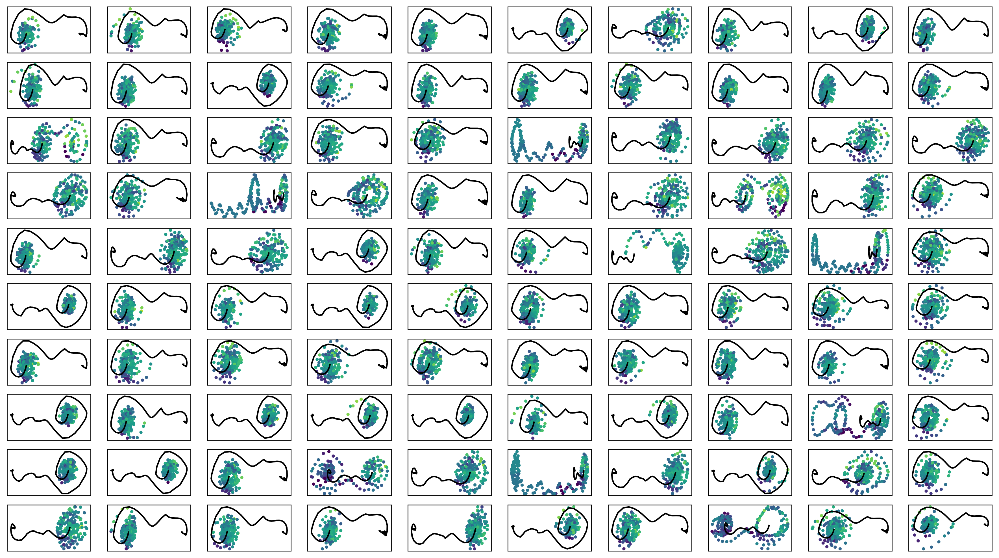

In [40]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter3.png")

In [44]:
train_curve1, valid_curve1 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()

train_curve2, valid_curve2 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()

train_curve3, valid_curve3 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()

weight_alpha 0.1
train_weighted_vae: enc_dec
train: iter 0  trainloss -577.06823  validloss -602.67200±0.00000  bestvalidloss -602.67200  last_update 0
train: iter 1  trainloss -580.22188  validloss -598.17258±0.00000  bestvalidloss -602.67200  last_update 1
train: iter 2  trainloss -585.31786  validloss -606.19186±0.00000  bestvalidloss -606.19186  last_update 0
train: iter 3  trainloss -583.81463  validloss -599.54069±0.00000  bestvalidloss -606.19186  last_update 1
train: iter 4  trainloss -589.73805  validloss -601.70970±0.00000  bestvalidloss -606.19186  last_update 2
train: iter 5  trainloss -575.53743  validloss -590.40534±0.00000  bestvalidloss -606.19186  last_update 3
train: iter 6  trainloss -582.32011  validloss -587.61839±0.00000  bestvalidloss -606.19186  last_update 4
train: iter 7  trainloss -580.32380  validloss -587.30023±0.00000  bestvalidloss -606.19186  last_update 5
train: iter 8  trainloss -572.00473  validloss -595.65903±0.00000  bestvalidloss -606.19186  last_u

train: iter 76  trainloss -589.79324  validloss -576.50715±0.00000  bestvalidloss -626.36010  last_update 35
train: iter 77  trainloss -590.90046  validloss -616.87628±0.00000  bestvalidloss -626.36010  last_update 36
train: iter 78  trainloss -594.49097  validloss -615.42173±0.00000  bestvalidloss -626.36010  last_update 37
train: iter 79  trainloss -587.41037  validloss -597.57757±0.00000  bestvalidloss -626.36010  last_update 38
train: iter 80  trainloss -566.29893  validloss -599.45889±0.00000  bestvalidloss -626.36010  last_update 39
train: iter 81  trainloss -588.53638  validloss -564.52830±0.00000  bestvalidloss -626.36010  last_update 40
train: iter 82  trainloss -595.72041  validloss -602.72673±0.00000  bestvalidloss -626.36010  last_update 41
train: iter 83  trainloss -589.88442  validloss -588.64755±0.00000  bestvalidloss -626.36010  last_update 42
train: iter 84  trainloss -591.83153  validloss -612.33842±0.00000  bestvalidloss -626.36010  last_update 43
train: iter 85  tra

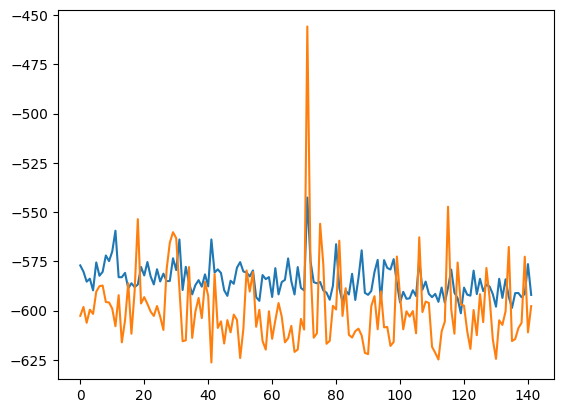

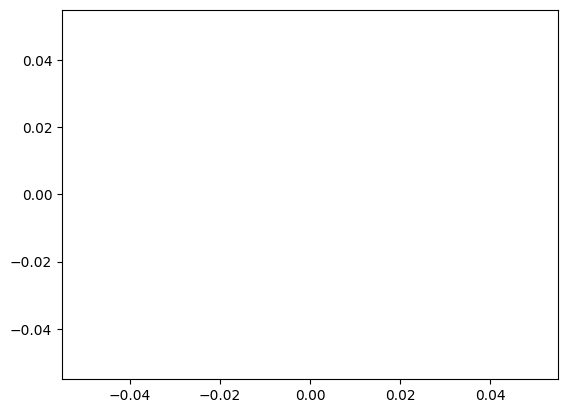

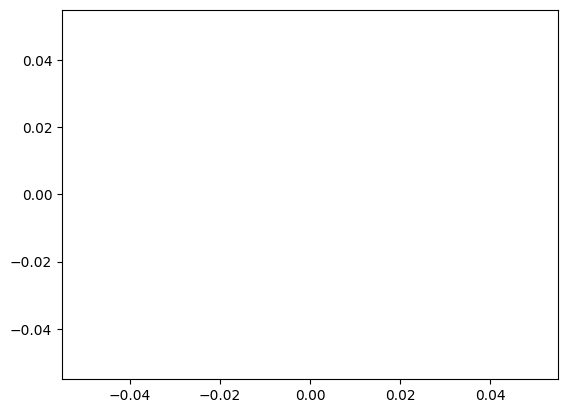

alpha 0.1 vae_lr 0.0005


In [45]:
plt.plot(train_curve1)
plt.plot(valid_curve1)
plt.show()

plt.plot(train_curve2)
plt.plot(valid_curve2)
plt.show()

plt.plot(train_curve3)
plt.plot(valid_curve3)
plt.show()
print("alpha",alpha, "vae_lr", vae_lr)

In [ ]:
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
# simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)




 0 1.430511474609375e-06

 1 5.495400428771973

 2 4.079084157943726

 3 3.776374340057373

 4 3.602017879486084

 5 3.528571128845215

 6 4.6714537143707275
predict diverge [ 14.46300882 -60.76187194] [  0.07780472 -70.96882866] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 35

 7 1.5347962379455566

 8 7.723525285720825

 9 7.319981575012207

 10 3.6917386054992676

 11 3.9131805896759033

 12 3.633915424346924

 13 6.200817346572876

 14 7.5133233070373535

 15 7.489098310470581

 16 7.389321327209473

 17 4.738823413848877

 18 3.7279438972473145

 19 3.3850746154785156

 20 3.7669007778167725
predict diverge [12.82028001 65.10072514] [ 0.43663761 57.38345831] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 44

 21 0.8694813251495361

 22 3.8152410984039307
predict diverge [13.41221815 21.68564809] [1.39937813 9.51681585] [98.16052 20.     ] [49.08026 10.     ] sim_timestep 39

 23 0.9150681495666504

 24 3.7600526809692383

 25 3.830024242401123
predict diverge [12.37

In [ ]:
fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
#     ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter3.png")
plt.savefig(figfilenamehead+"joint_iter3.eps")
# plt.savefig(figfilenamehead+"joint_iter3.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

In [ ]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter3.png")
plt.savefig(figfilenamehead+"damping_latent_iter3.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter3.pdf")
plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [ ]:
print(datetime.datetime.now())

# Iter 4

In [ ]:
# iwvi.get_sim_rollout_bamdppolicy_data_randomstop()

In [ ]:
# iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)


In [ ]:
# loss_list.append(iwvi.eval_loss(weight_alpha=1.))
# normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


In [ ]:
# fig = plt.figure(figsize=(18,10), dpi=250)
# ax_list = []
# # min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# # max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
# min_val = 1e-8
# max_val = 1e3
# print(min_val, max_val)

# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
# plt.savefig(figfilenamehead+"weight_iter4.png")

In [ ]:
# train_curve1, valid_curve1 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
# iwvi.update_mulogvar_offlinedata()

# train_curve2, valid_curve2 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
# iwvi.update_mulogvar_offlinedata()

# train_curve3, valid_curve3 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
# iwvi.update_mulogvar_offlinedata()

In [ ]:
# plt.plot(train_curve1)
# plt.plot(valid_curve1)
# plt.show()

# plt.plot(train_curve2)
# plt.plot(valid_curve2)
# plt.show()

# plt.plot(train_curve3)
# plt.plot(valid_curve3)
# plt.show()
# print("alpha",alpha, "vae_lr", vae_lr)

In [ ]:
# iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
# simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
# simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
# # iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
# # simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)



In [ ]:
# fig = plt.figure(figsize=(18,10), dpi=250)
# fig.patch.set_facecolor('white')
# ax_list = []
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
# #     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
# #     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
#     ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
#     ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
# #     ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 

#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
# plt.savefig(figfilenamehead+"joint_iter4.png")
# plt.savefig(figfilenamehead+"joint_iter4.eps")
# # plt.savefig(figfilenamehead+"joint_iter4.pdf")

# print("実環境方策rollout vs Sim環境方策rollout")

In [ ]:
# plt.figure(figsize=(16,12))
# np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.xlim([0,0.3])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.savefig(figfilenamehead+"damping_latent_iter4.png")
# plt.savefig(figfilenamehead+"damping_latent_iter4.eps")
# # plt.savefig(figfilenamehead+"damping_latent_iter4.pdf")
# plt.show()



# for i in range(10):
#     print(debug_info[i*10 : (i+1)*10,1])
# # plt.show()
# print("摩擦係数-潜在変数")

In [ ]:
print(datetime.datetime.now())

# Iter5

In [ ]:
# iwvi.get_sim_rollout_bamdppolicy_data_randomstop()

In [ ]:
# iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)


In [ ]:
# loss_list.append(iwvi.eval_loss(weight_alpha=1.))
# normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


In [ ]:
# fig = plt.figure(figsize=(18,10), dpi=250)
# ax_list = []
# # min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# # max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
# min_val = 1e-8
# max_val = 1e3
# print(min_val, max_val)

# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
# plt.savefig(figfilenamehead+"weight_iter5.png")

In [ ]:
# train_curve1, valid_curve1 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
# iwvi.update_mulogvar_offlinedata()

# train_curve2, valid_curve2 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
# iwvi.update_mulogvar_offlinedata()

# train_curve3, valid_curve3 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
# iwvi.update_mulogvar_offlinedata()

In [ ]:
# plt.plot(train_curve1)
# plt.plot(valid_curve1)
# plt.show()

# plt.plot(train_curve2)
# plt.plot(valid_curve2)
# plt.show()

# plt.plot(train_curve3)
# plt.plot(valid_curve3)
# plt.show()
# print("alpha",alpha, "vae_lr", vae_lr)

In [ ]:
# iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
# simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
# simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
# # iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
# # simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)



In [ ]:
# fig = plt.figure(figsize=(18,10), dpi=250)
# fig.patch.set_facecolor('white')
# ax_list = []
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
# #     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
# #     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
#     ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
#     ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
# #     ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 

#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
# plt.savefig(figfilenamehead+"joint_iter5.png")
# plt.savefig(figfilenamehead+"joint_iter5.eps")
# # plt.savefig(figfilenamehead+"joint_iter5.pdf")

# print("実環境方策rollout vs Sim環境方策rollout")

In [ ]:
# plt.figure(figsize=(16,12))
# np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.xlim([0,0.3])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.savefig(figfilenamehead+"damping_latent_iter5.png")
# plt.savefig(figfilenamehead+"damping_latent_iter5.eps")
# # plt.savefig(figfilenamehead+"damping_latent_iter5.pdf")

# plt.show()




# for i in range(10):
#     print(debug_info[i*10 : (i+1)*10,1])
# # plt.show()
# print("摩擦係数-潜在変数")

In [ ]:
print(datetime.datetime.now())

# 評価関数計算

In [ ]:
iwvi.get_sim_rollout_bamdppolicy_data_randomstop()

In [ ]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)


In [ ]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


In [ ]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter6.png")

In [ ]:
train_curve, valid_curve = iwvi.train_initial_belief(num_iter=100000, lr=1e-3, early_stop_step=100)


In [ ]:
print(iwvi.initial_belief)


In [ ]:
train_curve, valid_curve = iwvi.train_penalty(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100)

In [ ]:
iwvi.save(ckpt_key="policy_optimization_iter1")

In [ ]:
loss_array = np.array(loss_list)

In [ ]:
plt.figure(figsize=(16,12))
plt.plot(loss_array[:,0])
plt.xlabel("iteration")
plt.ylabel("loss")
plt.savefig(figfilenamehead+"learning_curve.png")
plt.savefig(figfilenamehead+"learning_curve.eps")
# plt.savefig(figfilenamehead+"policy_evaluartion_learning_curve.pdf")

In [ ]:
normalized_loss_array = np.array(normalized_loss_list)
plt.figure(figsize=(16,12))
plt.plot(normalized_loss_array[:,0])
plt.xlabel("iteration")
plt.ylabel("loss")
plt.savefig(figfilenamehead+"learning_curve_normalized_"+env_str+".png")
plt.savefig(figfilenamehead+"learning_curve_normalized_"+env_str+".eps")